In [1]:
%matplotlib inline
import pandas as pd
"""
Demo using fontdict to control style of text and labels.
"""
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt

idx = pd.IndexSlice



In [2]:
poblacion = pd.read_csv('https://raw.githubusercontent.com/rchorda/covid/master/demo_r_d2jan_1_Data.csv',sep=';',index_col=['Flag and Footnotes'])

In [3]:
dateparse = lambda x: pd.datetime.strptime(x, '%d/%m/%y')
#datos = pd.read_csv('https://covid19.isciii.es/resources/serie_historica_acumulados.csv',
datos = pd.read_csv('https://cnecovid.isciii.es/covid19/resources/agregados.csv',
            encoding = "ISO-8859-1",skipfooter=9,#nrows=1738,
            index_col=[1,0],
            parse_dates=[1],
            infer_datetime_format=True,
            engine='python',
            #date_parser=dateparse,
            #dayfirst=True,# yearfirst=False
            )#[:-5]
#datos.sort_index([0,1])
#datos.sort_values(['CCAA','FECHA'],inplace=True)

datos.tail(15)

CASOS   PCR+  TestAc+  Hospitalizados     UCI  Fallecidos
FECHA      CCAA                                                           
2020-05-20 CN      NaN   2307      0.0           944.0   179.0       155.0
           CB      NaN   2279    519.0          1036.0    79.0       209.0
           CM      NaN  16789   8634.0          9138.0   639.0      2919.0
           CL      NaN  18627   6291.0          8735.0   561.0      1960.0
           CT      NaN  55888   1643.0         29497.0  2969.0      6021.0
           CE      NaN    119     59.0            11.0     4.0         4.0
           VC      NaN  10987   3810.0          5747.0   730.0      1383.0
           EX      NaN   3042   1001.0          1780.0   110.0       505.0
           GA      NaN   9077   2026.0          2943.0   334.0       608.0
           MD      NaN  67049   5293.0         42497.0  3617.0      8931.0
           ML      NaN    121     13.0            44.0     3.0         2.0
           MC      NaN   1570   1039.0           680.0   112.0       149.0
           NC      NaN   5195   3157.0          2048.0   136.0       506.0
           PV      NaN  13421   5358.0          7032.0   578.0      1483.0
           RI      NaN   4033   1395.0          1504.0    91.0       354.0

In [4]:
#datos = datos[:-8]
#display(datos.loc[idx['2020-04-28','GA'],:])
datos.loc[idx['2020-04-28','GA'],'CASOS'] = np.nan
#kk = datos.at[idx['2020-04-28','GA'],'Fallecidos'] - 125
#datos.loc[idx['2020-04-28','GA'],'Fallecidos'] = kk

datos.loc[:,'Total'] = datos['CASOS']
datos.loc[:,'Total'] = datos.Total.fillna(datos['PCR+'])
#datos['Total'] = datos[['CASOS','PCR+']].sum(axis=1)
datos.loc[:,'DTotal'] = datos.Total.groupby(by='CCAA').diff()
datos.loc[:,'DFallecidos'] = datos.Fallecidos.groupby(by='CCAA').diff()
#datos.loc[:,'DRecuperados'] = datos.Recuperados.groupby(by='CCAA').diff()
datos.tail(38)
#datos.loc[idx['2020-04-28':]]

CASOS   PCR+  TestAc+  Hospitalizados     UCI  Fallecidos  \
FECHA      CCAA                                                              
2020-05-19 AN      NaN  12502   3999.0          6196.0   764.0      1371.0   
           AR      NaN   5551   1751.0          2434.0   255.0       847.0   
           AS      NaN   2374    985.0          1089.0   121.0       304.0   
           IB      NaN   2016    106.0          1142.0   168.0       221.0   
           CN      NaN   2300      0.0           943.0   179.0       155.0   
           CB      NaN   2277    510.0          1036.0    79.0       209.0   
           CM      NaN  16739   8546.0          9122.0   639.0      2913.0   
           CL      NaN  18586   6290.0          8734.0   555.0      1960.0   
           CT      NaN  55888   1643.0         29497.0  2969.0      6021.0   
           CE      NaN    119     59.0            11.0     4.0         4.0   
           VC      NaN  10949   3810.0          5742.0   727.0      1378.0   
           EX      NaN   3040   1001.0          1780.0   110.0       504.0   
           GA      NaN   9067   2014.0          2939.0   334.0       607.0   
           MD      NaN  66967   5293.0         42422.0  3610.0      8912.0   
           ML      NaN    121     13.0            44.0     3.0         2.0   
           MC      NaN   1560   1039.0           679.0   112.0       148.0   
           NC      NaN   5192   3157.0          2048.0   136.0       503.0   
           PV      NaN  13412   5358.0          7024.0   578.0      1480.0   
           RI      NaN   4033   1395.0          1499.0    91.0       353.0   
2020-05-20 AN      NaN  12547   3999.0          6210.0   766.0      1375.0   
           AR      NaN   5588   1751.0          2442.0   256.0       848.0   
           AS      NaN   2374    985.0          1089.0   121.0       307.0   
           IB      NaN   2024    107.0          1144.0   169.0       221.0   
           CN      NaN   2307      0.0           944.0   179.0       155.0   
           CB      NaN   2279    519.0          1036.0    79.0       209.0   
           CM      NaN  16789   8634.0          9138.0   639.0      2919.0   
           CL      NaN  18627   6291.0          8735.0   561.0      1960.0   
           CT      NaN  55888   1643.0         29497.0  2969.0      6021.0   
           CE      NaN    119     59.0            11.0     4.0         4.0   
           VC      NaN  10987   3810.0          5747.0   730.0      1383.0   
           EX      NaN   3042   1001.0          1780.0   110.0       505.0   
           GA      NaN   9077   2026.0          2943.0   334.0       608.0   
           MD      NaN  67049   5293.0         42497.0  3617.0      8931.0   
           ML      NaN    121     13.0            44.0     3.0         2.0   
           MC      NaN   1570   1039.0           680.0   112.0       149.0   
           NC      NaN   5195   3157.0          2048.0   136.0       506.0   
           PV      NaN  13421   5358.0          7032.0   578.0      1483.0   
           RI      NaN   4033   1395.0          1504.0    91.0       354.0   

                   Total  DTotal  DFallecidos  
FECHA      CCAA                                
2020-05-19 AN    12502.0    13.0          4.0  
           AR     5551.0    31.0          4.0  
           AS     2374.0     1.0          1.0  
           IB     2016.0    13.0          2.0  
           CN     2300.0     6.0          0.0  
           CB     2277.0     4.0          1.0  
           CM    16739.0    62.0         13.0  
           CL    18586.0    37.0          0.0  
           CT    55888.0    63.0         40.0  
           CE      119.0     2.0          0.0  
           VC    10949.0    22.0          2.0  
           EX     3040.0     2.0          0.0  
           GA     9067.0     9.0          0.0  
           MD    66967.0   139.0         18.0  
           ML      121.0     0.0          0.0  
           MC     1560.0     2.0          3.0  
           NC     5192.0     9.0

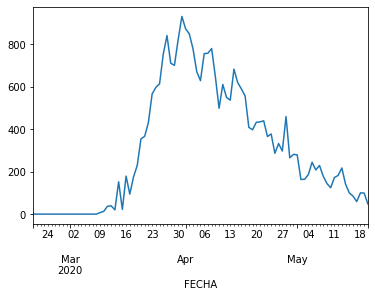

In [5]:
datos.groupby('FECHA').sum().DFallecidos.plot()

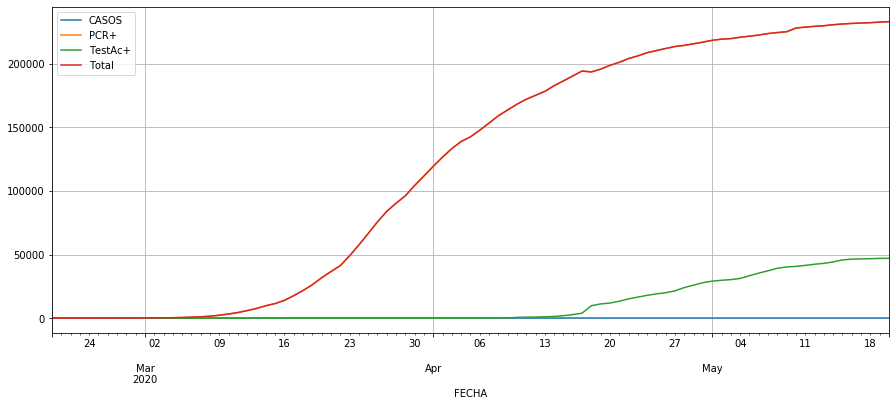

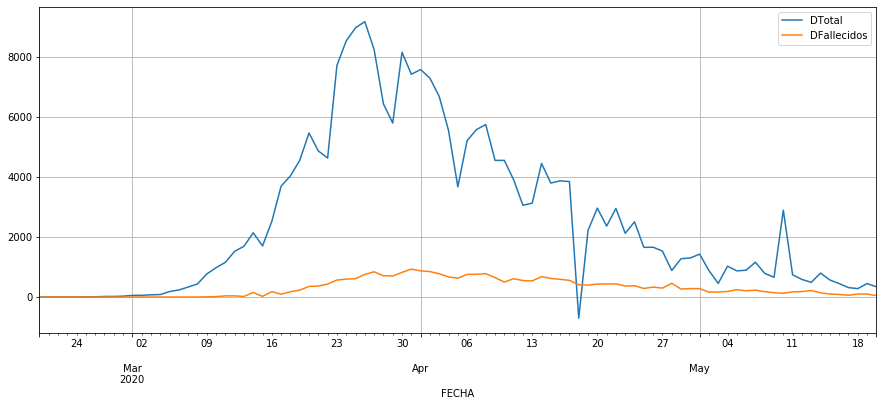

In [6]:
kv = datos.groupby('FECHA').sum()#.loc['AR']#.dropna()
#kv['Total'] = kv[['CASOS','PCR+']].sum(axis=1)
#kv['DTotal'] = np.gradient(kv.Total)
#kv['DFallecidos'] = np.gradient(kv.Fallecidos)
#kv['DRecuperados'] = np.gradient(kv.Recuperados)

fig, ax = plt.subplots(figsize=(15,6))
kv[['CASOS']].plot(ax=ax)
kv[['PCR+']].plot(ax=ax)
kv[['TestAc+']].plot(ax=ax)
kv[['Total']].plot(ax=ax)
plt.grid()
plt.show()


fig, ax = plt.subplots(figsize=(15,6))
kv[['DTotal']].plot(ax=ax)
kv[['DFallecidos']].plot(ax=ax)
#kv[['DRecuperados']].plot(ax=ax)
plt.grid()

In [7]:
kv

,CASOS,PCR+,TestAc+,Hospitalizados,UCI,Fallecidos,Total,DTotal,DFallecidos
FECHA,,,,,,,,,
2020-02-20,0.0,3,0.0,26.0,0.0,0.0,3.0,0.0,0.0
2020-02-21,0.0,3,0.0,30.0,1.0,0.0,3.0,0.0,0.0
2020-02-22,0.0,3,0.0,33.0,1.0,0.0,3.0,0.0,0.0
2020-02-23,0.0,3,0.0,38.0,2.0,0.0,3.0,0.0,0.0
2020-02-24,0.0,4,0.0,49.0,2.0,0.0,4.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
2020-05-16,0.0,231651,46369.0,123835.0,11378.0,27634.0,231651.0,448.0,85.0
2020-05-17,0.0,231966,46582.0,123991.0,11391.0,27693.0,231966.0,315.0,59.0
2020-05-18,0.0,232246,46766.0,124421.0,11403.0,27793.0,232246.0,280.0,100.0


In [8]:
owid_covid = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv',
                        
            index_col=[1,2],
            parse_dates=[2],
            infer_datetime_format=True,)
owid_covid.columns

Index(['iso_code', 'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
       'total_cases_per_million', 'new_cases_per_million',
       'total_deaths_per_million', 'new_deaths_per_million', 'total_tests',
       'new_tests', 'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_100k'],
      dtype='object')

In [9]:
owid_covid.index.levels[1]

DatetimeIndex(['2019-12-31', '2020-01-01', '2020-01-02', '2020-01-03',
               '2020-01-04', '2020-01-05', '2020-01-06', '2020-01-07',
               '2020-01-08', '2020-01-09',
               ...
               '2020-05-25', '2020-05-26', '2020-05-27', '2020-05-28',
               '2020-05-29', '2020-05-30', '2020-05-31', '2020-06-01',
               '2020-06-02', '2020-06-03'],
              dtype='datetime64[ns]', name='date', length=156, freq=None)

Relación entre los casos detectados y los Fallecimientos
---------------

Ambas gráficas se superponen bastante bien si las decalamos siete días y consideramos una mortalidad del 12% respecto a los casos detectados:

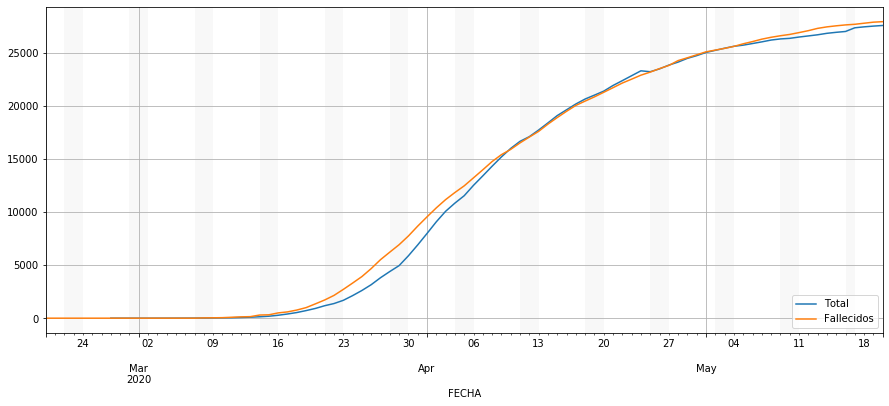

In [10]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(kv.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices)-1:
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=dt.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=dt.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=dt.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=dt.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=dt.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=dt.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=dt.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=dt.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=dt.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')

        

fig, ax = plt.subplots(figsize=(15,6))
(kv[['Total']].shift(7)*.12).plot(ax=ax)
(kv[['Fallecidos']]).plot(ax=ax)
highlight_datetimes(kv.index, ax,items=False)
plt.legend()
plt.grid()

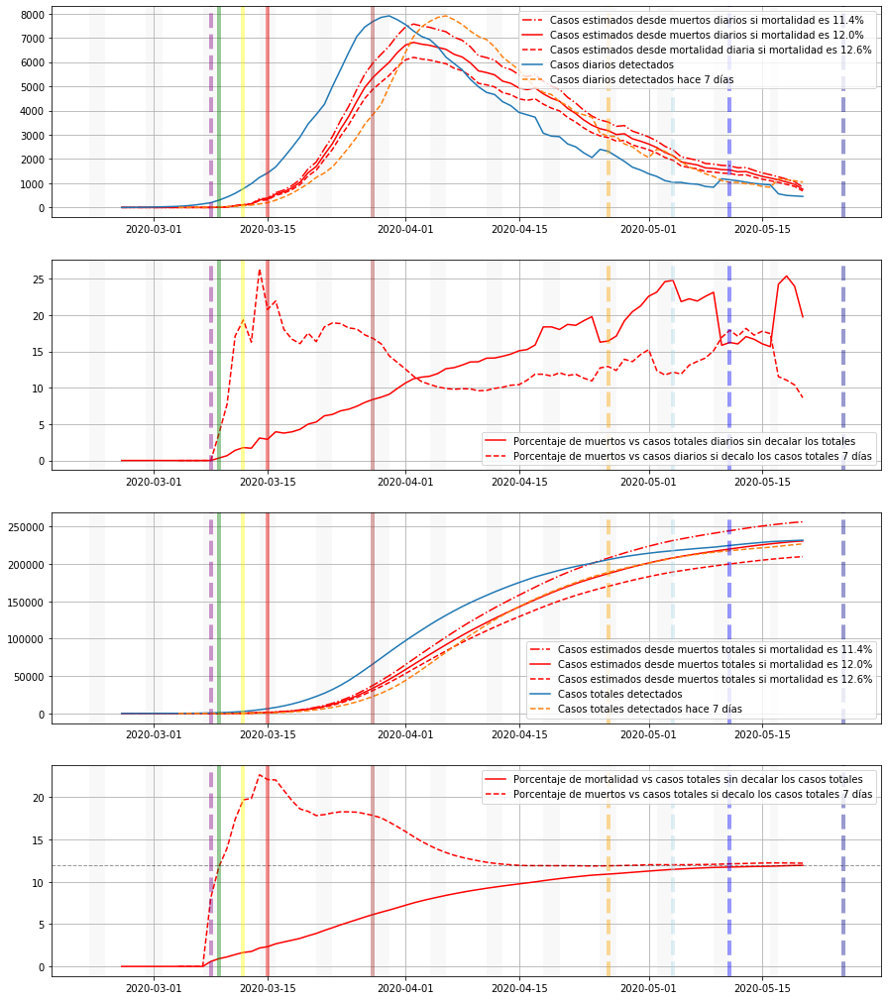

In [11]:
diasRetraso = 7
porcenMorta = 12

fig, ax = plt.subplots(4,figsize=(15,18))
ax[0].plot(kv.index,
        (kv[['DFallecidos']].rolling(7).mean()/(porcenMorta*.9/100.)),'-.',
         label='Casos estimados desde muertos diarios si mortalidad es {:.1f}%'.format(porcenMorta*.95),color='r')
ax[0].plot(kv.index,
        (kv[['DFallecidos']].rolling(7).mean()/(porcenMorta/100.)),
         label='Casos estimados desde muertos diarios si mortalidad es {:.1f}%'.format(porcenMorta),color='r')
ax[0].plot(kv.index,
        (kv[['DFallecidos']].rolling(7).mean()/(porcenMorta*1.1/100.)),'--',
         label='Casos estimados desde mortalidad diaria si mortalidad es {:.1f}%'.format(porcenMorta*1.05),color='r')
ax[0].plot(kv.index,kv[['DTotal']].rolling(7).mean(),label='Casos diarios detectados')
ax[0].plot(kv.index,kv[['DTotal']].rolling(7).mean().shift(diasRetraso),'--',
        label='Casos diarios detectados hace {} días'.format(diasRetraso))
#(kv[['DTotal']].rolling(7).mean()).plot(ax=ax)
#(kv[['DTotal']].rolling(7).mean().shift(7)).plot(ax=ax)
ax[0].legend()
ax[0].grid()
highlight_datetimes(kv.index, ax[0])


ax[1].plot(kv.index,
           (kv['DFallecidos'].rolling(7).mean()/kv['DTotal'].rolling(7).mean()*100.),
           color='r',
           label='Porcentaje de muertos vs casos totales diarios sin decalar los totales'.format(diasRetraso),
          )
ax[1].plot(kv.index,
           (kv['DFallecidos'].rolling(7).mean()/(kv['DTotal'].rolling(7).mean().shift(diasRetraso))*100.),
           '--',color='r',
           label='Porcentaje de muertos vs casos diarios si decalo los casos totales {} días'.format(diasRetraso),
          )
ax[1].grid()
ax[1].legend()
highlight_datetimes(kv.index, ax[1])

ax[2].plot(kv.index,
        (kv[['Fallecidos']].rolling(7).mean()/(porcenMorta*.9/100.)),'-.',
         label='Casos estimados desde muertos totales si mortalidad es {:.1f}%'.format(porcenMorta*.95),color='r')
ax[2].plot(kv.index,
        (kv[['Fallecidos']].rolling(7).mean()/(porcenMorta/100.)),
         label='Casos estimados desde muertos totales si mortalidad es {:.1f}%'.format(porcenMorta),color='r')
ax[2].plot(kv.index,
        (kv[['Fallecidos']].rolling(7).mean()/(porcenMorta*1.1/100.)),'--',
         label='Casos estimados desde muertos totales si mortalidad es {:.1f}%'.format(porcenMorta*1.05),color='r')
ax[2].plot(kv.index,kv[['Total']].rolling(7).mean(),label='Casos totales detectados')
ax[2].plot(kv.index,kv[['Total']].rolling(7).mean().shift(diasRetraso),'--',
        label='Casos totales detectados hace {} días'.format(diasRetraso))
ax[2].grid()
ax[2].legend()
highlight_datetimes(kv.index, ax[2])

ax[3].plot(kv.index,
           (kv['Fallecidos'].rolling(7).mean()/kv['Total'].rolling(7).mean()*100.),
           color='r',
           label='Porcentaje de mortalidad vs casos totales sin decalar los casos totales'.format(diasRetraso),
          )
ax[3].plot(kv.index,
           (kv['Fallecidos'].rolling(7).mean()/(kv['Total'].rolling(7).mean().shift(diasRetraso))*100.),
           '--',color='r',
           label='Porcentaje de muertos vs casos totales si decalo los casos totales {} días'.format(diasRetraso),
          )
ax[3].axhline(y=12,ls='--',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')
        
ax[3].grid()
ax[3].legend()
highlight_datetimes(kv.index, ax[3])


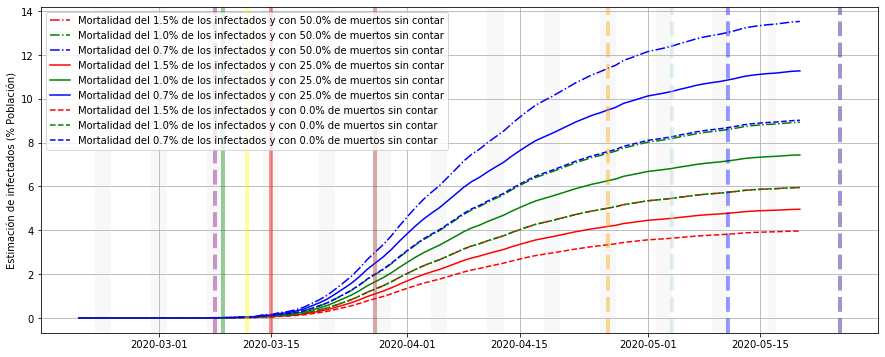

In [12]:
#poblacion = 46400000
porcenErrorMuertos = 25.#100*5000/23000#25. 

fig, ax = plt.subplots(figsize=(15,6))
for porcenErrorMuertos,l in zip([50.,25.,0.],['-.','-','--']):
    for i,c in zip([1.5,1,.66],['r','g','b']):
        ax.plot(kv.index,kv[['Fallecidos']].values*(100.+porcenErrorMuertos)*(100./i)/poblacion.Value.sum(),
                l,
                color=c,
                label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,porcenErrorMuertos))
    #ax.plot(kv.index,kv[['Fallecidos']].values*(100)*(100./i)/poblacion.Value.sum(),'--',
    #        color=c,
    #        label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,0))
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.03/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.01/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.006/poblacion.Value.sum()).plot(ax=ax)
ax.set_ylabel('Estimación de infectados (% Población)')
plt.grid()
plt.legend()
#ax.set_title('Mortalidad (+ Subestimación mortalidad de {:.2f}) = ')
highlight_datetimes(kv.index, ax)

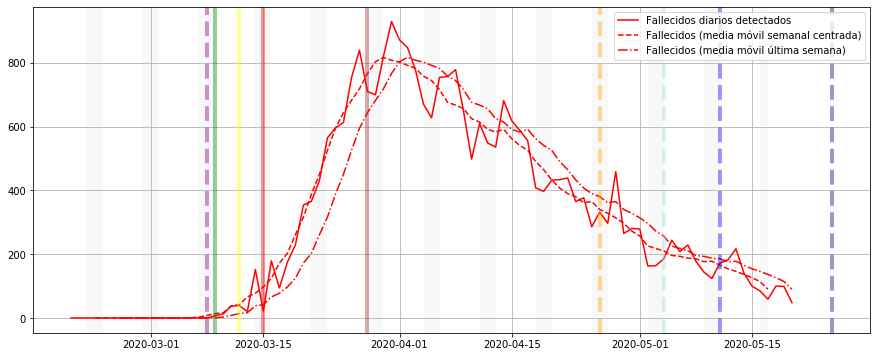

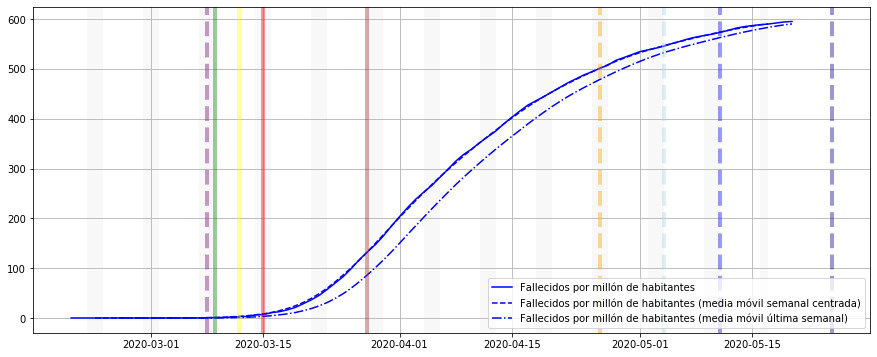

In [13]:
fig, ax = plt.subplots(figsize=(15,6))
ax.plot(kv.index,kv[['DFallecidos']],color='r',label='Fallecidos diarios detectados')
ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=True).mean(),'--',color='r',
        label='Fallecidos (media móvil semanal centrada)')
ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean(),'-.',color='r',
        label='Fallecidos (media móvil última semana)')
plt.grid()
plt.legend()
highlight_datetimes(kv.index, ax)
plt.show()

fig, ax = plt.subplots(figsize=(15,6))
ax.plot(kv.index,kv[['Fallecidos']]/poblacion.Value.sum()*1000000,color='b',label='Fallecidos por millón de habitantes')
ax.plot(kv.index,kv[['Fallecidos']].rolling(7,center=True).mean()/poblacion.Value.sum()*1000000,'--',color='b',
        label='Fallecidos por millón de habitantes (media móvil semanal centrada)')
ax.plot(kv.index,kv[['Fallecidos']].rolling(7,center=False).mean()/poblacion.Value.sum()*1000000,'-.',color='b',
        label='Fallecidos por millón de habitantes (media móvil última semanal)')
plt.grid()
plt.legend()
highlight_datetimes(kv.index, ax)
plt.show()

In [14]:
12/7.5

1.6

8.0


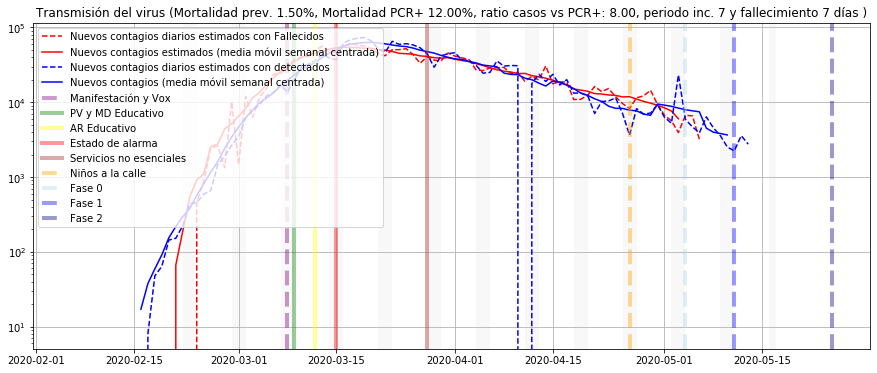

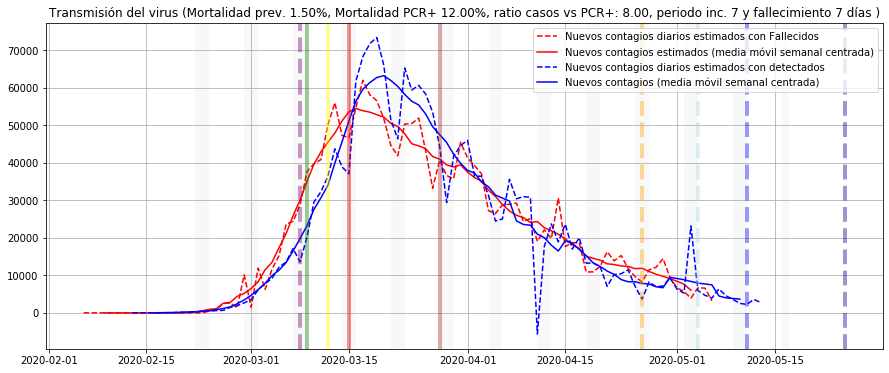

In [15]:
diasIncubacion = 7
diasRetraso = 7
mortalidadVsDetecciones = 12./100.
mortalidad = 1.5/100.
ratioCasosDetecciones = mortalidadVsDetecciones / mortalidad
print(ratioCasosDetecciones)
fig, ax = plt.subplots(figsize=(15,6))
plt.title('Transmisión del virus (Mortalidad prev. {:.2f}%, Mortalidad PCR+ {:.2f}%, ratio casos vs PCR+: {:.2f}, periodo inc. {} y fallecimiento {} días )'.format(
    100*mortalidad,100*mortalidadVsDetecciones,ratioCasosDetecciones,diasIncubacion,diasRetraso
))
ax.plot(kv.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),kv[['DFallecidos']]/mortalidad,'--',color='r',label='Nuevos contagios diarios estimados con Fallecidos')
ax.plot(kv.index-pd.DateOffset(days=diasRetraso+diasIncubacion),kv[['DFallecidos']].rolling(7,center=True).mean()/mortalidad,'-',color='r',
        label='Nuevos contagios estimados (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean().shift(-1*diasRetraso)/.12,'-.',color='r',
#        label='Fallecidos (media móvil última semana)')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']]*ratioCasosDetecciones,'--',color='b',label='Nuevos contagios diarios estimados con detectados')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']].rolling(7,center=True).mean()*ratioCasosDetecciones,'-',color='b',
        label='Nuevos contagios (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DTotal']].rolling(7,center=False).mean(),'-.',color='b',
#        label='Nuevos casos  (media móvil última semana)')

highlight_datetimes(kv.index, ax)


plt.grid()
plt.legend(loc='upper left')

plt.yscale('log')
plt.show()

fig, ax = plt.subplots(figsize=(15,6))
plt.title('Transmisión del virus (Mortalidad prev. {:.2f}%, Mortalidad PCR+ {:.2f}%, ratio casos vs PCR+: {:.2f}, periodo inc. {} y fallecimiento {} días )'.format(
    100*mortalidad,100*mortalidadVsDetecciones,ratioCasosDetecciones,diasIncubacion,diasRetraso
))
ax.plot(kv.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),kv[['DFallecidos']]/mortalidad,'--',color='r',label='Nuevos contagios diarios estimados con Fallecidos')
ax.plot(kv.index-pd.DateOffset(days=diasRetraso+diasIncubacion),kv[['DFallecidos']].rolling(7,center=True).mean()/mortalidad,'-',color='r',
        label='Nuevos contagios estimados (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean().shift(-1*diasRetraso)/.12,'-.',color='r',
#        label='Fallecidos (media móvil última semana)')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']]*ratioCasosDetecciones,'--',color='b',label='Nuevos contagios diarios estimados con detectados')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']].rolling(7,center=True).mean()*ratioCasosDetecciones,'-',color='b',
        label='Nuevos contagios (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DTotal']].rolling(7,center=False).mean(),'-.',color='b',
#        label='Nuevos casos  (media móvil última semana)')



plt.grid()
plt.legend()
highlight_datetimes(kv.index, ax)


plt.show()

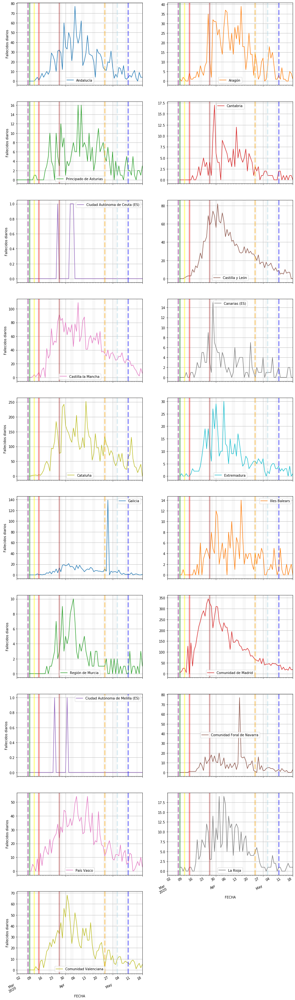

In [16]:


axes = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).plot(subplots=True, 
                                                                grid=True,
                                                                figsize=(15, 60),
                                                                layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        highlight_datetimes(kv.index, kaxi[0])
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos diarios')
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        highlight_datetimes(kv.index, kaxi[1])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue

plt.show()

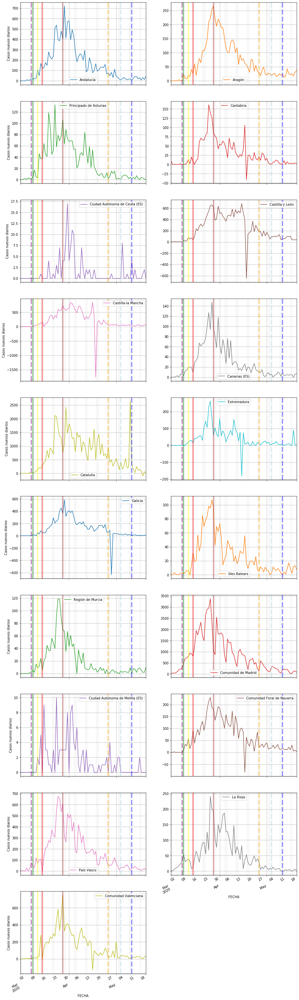

In [17]:
axes = datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).plot(subplots=True,
                                                                    grid=True, 
                                                                    figsize=(15, 60), 
                                                                    layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Casos nuevos diarios')
        highlight_datetimes(kv.index, kaxi[0])
        highlight_datetimes(kv.index, kaxi[1])
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue
#plt.title('Casos nuevos diarios')
plt.show()


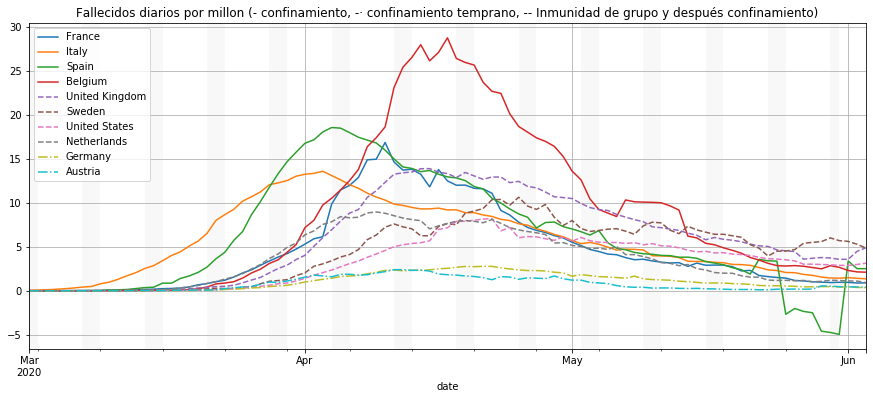

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-05-11,1.072,2.729,2.631,6.471,3.948,4.950000e-01,2.218,1.050,0.263,0.333
2020-05-12,4.029,2.961,3.764,4.400,3.093,3.070000e+00,3.492,0.934,1.385,0.222
2020-05-13,5.331,2.845,3.935,4.659,9.236,5.644000e+00,5.145,3.151,1.205,0.333
2020-05-14,1.272,3.225,4.641,7.075,7.277,1.455600e+01,5.275,3.035,1.062,0.111
2020-05-15,5.377,4.333,2.952,5.177,6.305,6.832000e+00,5.356,1.634,1.205,0.222
2020-05-16,1.992,4.003,2.224,4.832,5.657,1.158500e+01,5.021,3.093,0.680,0.222
2020-05-17,1.348,2.531,1.861,3.969,6.894,2.772000e+00,3.583,1.576,0.394,0.000
2020-05-18,1.042,2.398,1.262,4.055,2.504,4.950000e-01,2.441,0.584,0.251,0.111
2020-05-19,2.850,1.637,1.476,2.416,2.357,1.881000e+00,2.390,0.817,0.859,0.000


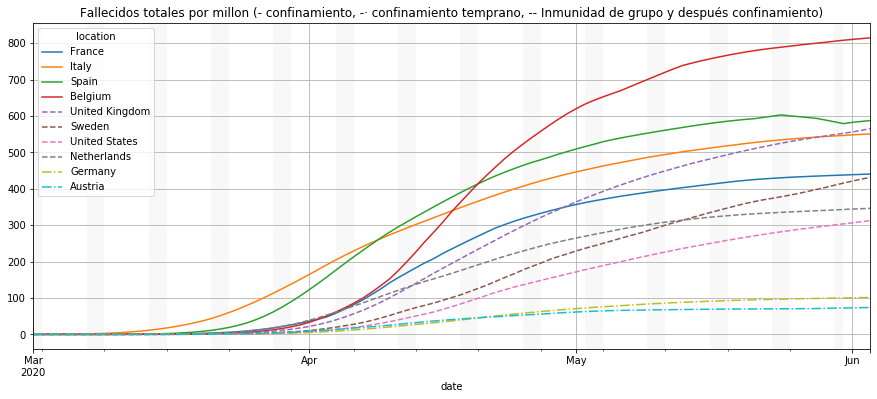

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-05-11,404.146,505.443,572.006,746.875,469.243,319.330,240.264,317.481,88.525,68.618
2020-05-12,408.175,508.403,575.770,751.276,472.336,322.400,243.756,318.415,89.910,68.840
2020-05-13,413.506,511.248,579.705,755.935,481.572,328.044,248.901,321.566,91.115,69.173
2020-05-14,414.778,514.473,584.347,763.011,488.849,342.599,254.176,324.601,92.178,69.284
2020-05-15,420.155,518.807,587.298,768.188,495.154,349.431,259.533,326.235,93.383,69.506
2020-05-16,422.147,522.809,589.523,773.020,500.810,361.016,264.554,329.328,94.063,69.728
2020-05-17,423.495,525.340,591.383,776.989,507.704,363.789,268.137,330.904,94.457,69.728
2020-05-18,424.537,527.738,592.645,781.044,510.208,364.284,270.578,331.488,94.708,69.839
2020-05-19,427.386,529.375,594.121,783.460,512.565,366.165,272.968,332.305,95.567,69.839


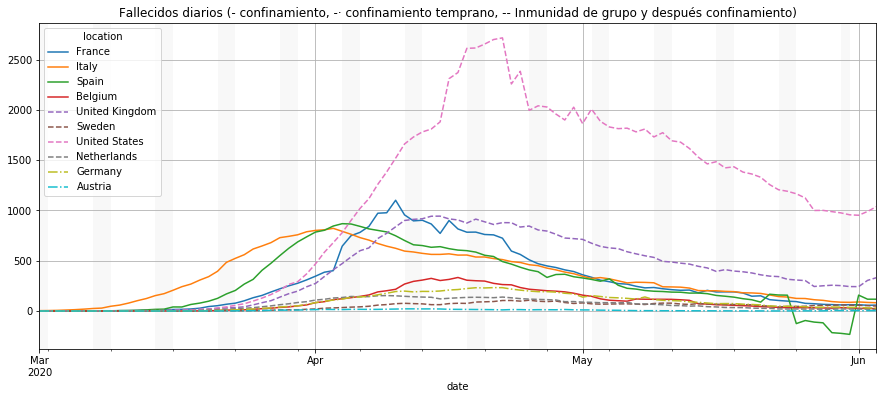

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-05-11,70.0,165.0,123.0,75.0,268.0,5.0,734.0,18.0,22.0,3.0
2020-05-12,263.0,179.0,176.0,51.0,210.0,31.0,1156.0,16.0,116.0,2.0
2020-05-13,348.0,172.0,184.0,54.0,627.0,57.0,1703.0,54.0,101.0,3.0
2020-05-14,83.0,195.0,217.0,82.0,494.0,147.0,1746.0,52.0,89.0,1.0
2020-05-15,351.0,262.0,138.0,60.0,428.0,69.0,1773.0,28.0,101.0,2.0
2020-05-16,130.0,242.0,104.0,56.0,384.0,117.0,1662.0,53.0,57.0,2.0
2020-05-17,88.0,153.0,87.0,46.0,468.0,28.0,1186.0,27.0,33.0,0.0
2020-05-18,68.0,145.0,59.0,47.0,170.0,5.0,808.0,10.0,21.0,1.0
2020-05-19,186.0,99.0,69.0,28.0,160.0,19.0,791.0,14.0,72.0,0.0


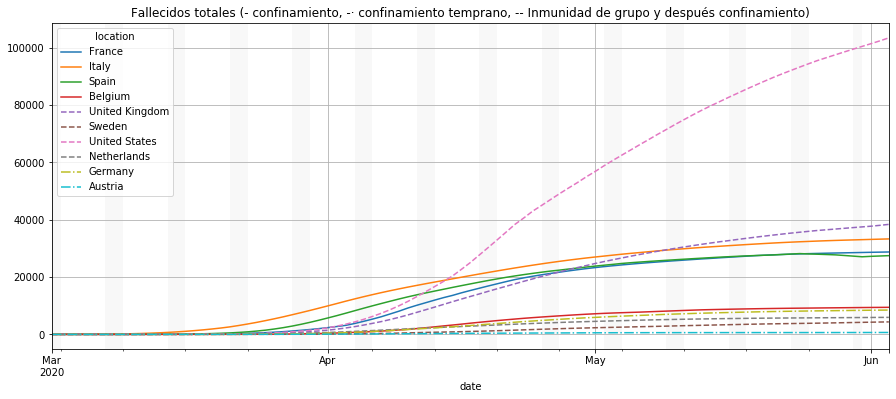

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-05-11,26380.0,30560.0,26744.0,8656.0,31855.0,3225.0,79528.0,5440.0,7417.0,618.0
2020-05-12,26643.0,30739.0,26920.0,8707.0,32065.0,3256.0,80684.0,5456.0,7533.0,620.0
2020-05-13,26991.0,30911.0,27104.0,8761.0,32692.0,3313.0,82387.0,5510.0,7634.0,623.0
2020-05-14,27074.0,31106.0,27321.0,8843.0,33186.0,3460.0,84133.0,5562.0,7723.0,624.0
2020-05-15,27425.0,31368.0,27459.0,8903.0,33614.0,3529.0,85906.0,5590.0,7824.0,626.0
2020-05-16,27555.0,31610.0,27563.0,8959.0,33998.0,3646.0,87568.0,5643.0,7881.0,628.0
2020-05-17,27643.0,31763.0,27650.0,9005.0,34466.0,3674.0,88754.0,5670.0,7914.0,628.0
2020-05-18,27711.0,31908.0,27709.0,9052.0,34636.0,3679.0,89562.0,5680.0,7935.0,629.0
2020-05-19,27897.0,32007.0,27778.0,9080.0,34796.0,3698.0,90353.0,5694.0,8007.0,629.0


In [18]:
lpaises = ['France','Italy','Spain','Belgium',
           'United Kingdom','Sweden','United States','Netherlands',
           'Germany','Austria']
           #'New Zealand','Australia']
llines  = ['-','-','-','-',
           '--','--','--','--',
           '-.','-.']

kindex = owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).loc[idx['2020-03-01':],lpaises].index

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Fallecidos diarios por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['new_deaths_per_million']].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                               grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-05-11':],lpaises])


fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos totales por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises,:],
               'total_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(kindex, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['total_deaths_per_million']].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                                 grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises],
               'total_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-05-11':],lpaises])

fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos diarios (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises],
               'new_deaths'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(kindex, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['new_deaths']].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                                 grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises],
               'new_deaths'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-05-11':],lpaises])


fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos totales (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises,:],
               'total_deaths'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(kindex, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['total_deaths_per_million']].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                                 grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises],
               'total_deaths'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-05-11':],lpaises])




In [19]:
owid_covid[owid_covid.iso_code == 'ESP'].unstack(level=0).rolling(7,center=True).apply(np.nanmean).loc[idx['2020-04-01':],'total_deaths_per_million']
owid_covid.loc[idx[lpaises],
               'new_deaths_per_million'].unstack(level=0).loc[idx['2020-04-01':]]
#for i in owid_covid.index.levels[0]:
#    print (i,owid_covid.loc[idx[i,:],'iso_code'].head(1).values[0])

location,Austria,Belgium,Germany,Spain,France,United Kingdom,Italy,Netherlands,Sweden,United States
date,,,,,,,,,,
2020-04-01,2.221,16.567,1.778,18.159,7.645,5.627,13.877,10.213,3.367,2.746
2020-04-02,1.999,10.613,1.671,18.479,7.798,9.869,12.024,7.820,5.842,3.199
2020-04-03,1.332,15.790,1.731,20.319,7.216,9.604,12.570,9.688,4.258,2.764
2020-04-04,1.110,11.390,1.683,19.934,30.702,10.518,12.636,8.637,5.050,3.335
2020-04-05,1.999,12.080,2.196,17.303,16.132,11.195,11.263,9.571,3.961,4.060
...,...,...,...,...,...,...,...,...,...,...
2020-05-30,0.000,4.746,0.465,0.086,0.797,4.773,1.439,1.634,8.317,3.683
2020-05-31,0.000,0.863,0.131,0.043,0.873,3.167,1.836,1.167,4.456,2.855
2020-06-01,0.000,1.208,0.131,17.389,0.475,1.665,1.240,0.292,0.000,1.819


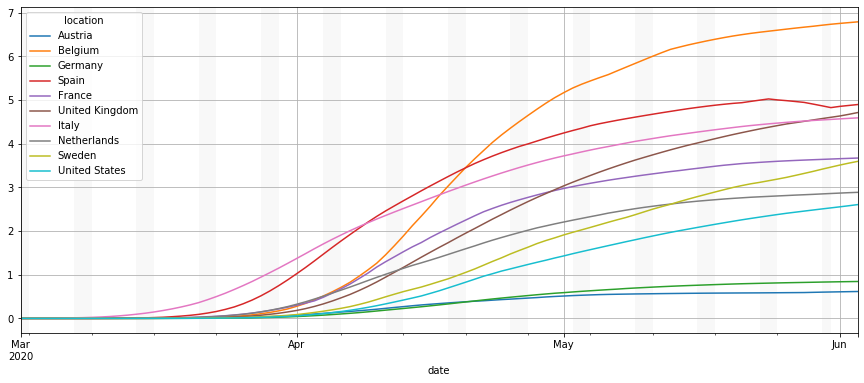

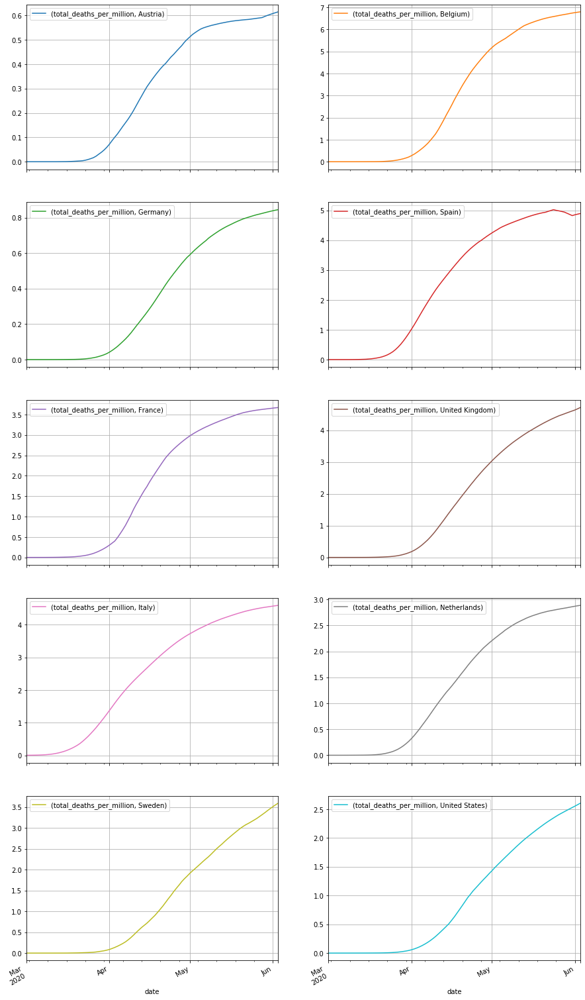

In [20]:
mortalidad = 1.5
porcenErrorMuertos = 25.#100*5000/23000#25. 



fig, ax = plt.subplots(figsize=(15,6))

(owid_covid.loc[lpaises,
               'total_deaths_per_million']*(100./mortalidad)/1000000*(100+porcenErrorMuertos)).unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(linestyle='-',ax=ax)
#(owid_covid.loc[lpaises,
#               'total_deaths_per_million']*(100./1.)/1000000*(100+porcenErrorMuertos)).unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(linestyle='--',ax=ax)
plt.grid()

highlight_datetimes(kindex, ax,items=False)
plt.show()
(owid_covid.loc[lpaises,
               ['total_deaths_per_million']]*(100./mortalidad)/1000000*(100+porcenErrorMuertos)).unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
                                                                                                                                 grid=True,
                                                                                  figsize=(15, 60), 
                                                                                  layout=(10, 2));




In [21]:
owid_spain = owid_covid.loc['Spain',:].loc['2020-03':]
#owid_spain 

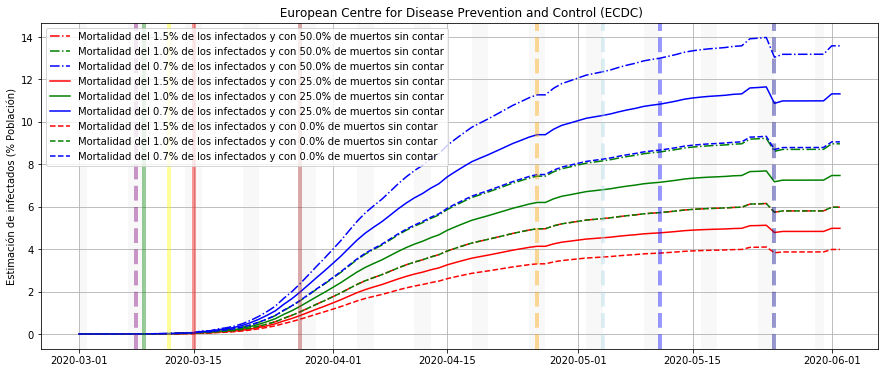

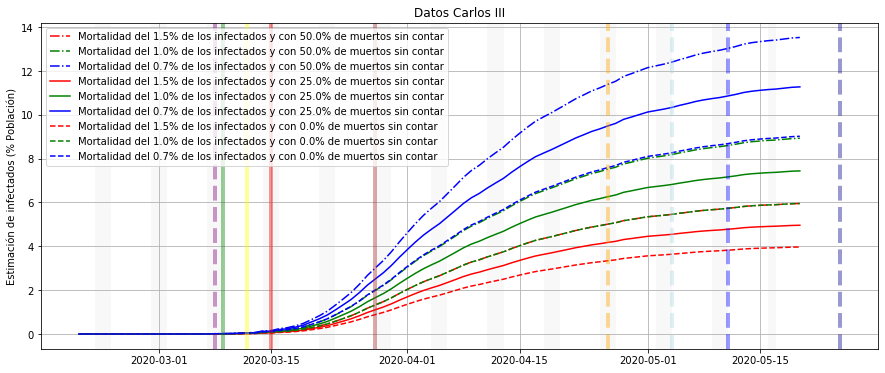

In [22]:

porcenErrorMuertos = 25.#100*5000/23000#25. 

fig, ax = plt.subplots(figsize=(15,6))
for porcenErrorMuertos,l in zip([50.,25.,0.],['-.','-','--']):
    for i,c in zip([1.5,1,.66],['r','g','b']):
        ax.plot(owid_spain.index,owid_spain.total_deaths_per_million*(100.+porcenErrorMuertos)*(100./i)/1000000.,
                l,
                color=c,
                label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,porcenErrorMuertos))
    #ax.plot(kv.index,kv[['Fallecidos']].values*(100)*(100./i)/poblacion.Value.sum(),'--',
    #        color=c,
    #        label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,0))
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.03/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.01/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.006/poblacion.Value.sum()).plot(ax=ax)
ax.set_ylabel('Estimación de infectados (% Población)')
plt.grid()
plt.legend()
plt.title(' European Centre for Disease Prevention and Control (ECDC)')
#ax.set_title('Mortalidad (+ Subestimación mortalidad de {:.2f}) = ')
highlight_datetimes(kindex, ax)
plt.show()
#ax.set_title(' European Centre for Disease Prevention and Control (ECDC)')
#poblacion = 46400000
porcenErrorMuertos = 25.#100*5000/23000#25. 

fig, ax = plt.subplots(figsize=(15,6))
for porcenErrorMuertos,l in zip([50.,25.,0.],['-.','-','--']):
    for i,c in zip([1.5,1,.66],['r','g','b']):
        ax.plot(kv.index,kv[['Fallecidos']].values*(100.+porcenErrorMuertos)*(100./i)/poblacion.Value.sum(),
                l,
                color=c,
                label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,porcenErrorMuertos))
    #ax.plot(kv.index,kv[['Fallecidos']].values*(100)*(100./i)/poblacion.Value.sum(),'--',
    #        color=c,
    #        label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,0))
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.03/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.01/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.006/poblacion.Value.sum()).plot(ax=ax)
ax.set_ylabel('Estimación de infectados (% Población)')
plt.grid()
plt.legend()
plt.title('Datos Carlos III')
#ax.set_title('Mortalidad (+ Subestimación mortalidad de {:.2f}) = ')
highlight_datetimes(kv.index, ax)
plt.show()

In [23]:
#poblacion = pd.read_csv('demo_r_d2jan_1_Data.csv',sep=';',index_col=['Flag and Footnotes'])
display(poblacion.tail())
poblacion.Value.sum()

,TIME,GEO,SEX,AGE,UNIT,Value
Flag and Footnotes,,,,,,
AN,2019,Andalucía,Total,Total,Number,8427405
MC,2019,Región de Murcia,Total,Total,Number,1487663
CE,2019,Ciudad Autónoma de Ceuta (ES),Total,Total,Number,84829
ML,2019,Ciudad Autónoma de Melilla (ES),Total,Total,Number,84689
CN,2019,Canarias (ES),Total,Total,Number,2206901


46937060

In [24]:
fallecidos = datos.loc[idx['2020-03-01':]].Fallecidos.unstack(level=1)
fallecidos.tail()

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-05-16,1358.0,838.0,299.0,207.0,4.0,1946.0,2893.0,151.0,5944.0,500.0,606.0,218.0,144.0,8847.0,2.0,503.0,1459.0,349.0,1366.0
2020-05-17,1358.0,838.0,301.0,207.0,4.0,1953.0,2898.0,153.0,5956.0,500.0,607.0,218.0,145.0,8863.0,2.0,503.0,1466.0,351.0,1370.0
2020-05-18,1367.0,843.0,303.0,208.0,4.0,1960.0,2900.0,155.0,5981.0,504.0,607.0,219.0,145.0,8894.0,2.0,503.0,1470.0,352.0,1376.0
2020-05-19,1371.0,847.0,304.0,209.0,4.0,1960.0,2913.0,155.0,6021.0,504.0,607.0,221.0,148.0,8912.0,2.0,503.0,1480.0,353.0,1378.0
2020-05-20,1375.0,848.0,307.0,209.0,4.0,1960.0,2919.0,155.0,6021.0,505.0,608.0,221.0,149.0,8931.0,2.0,506.0,1483.0,354.0,1383.0


In [25]:
poblacion.loc[fallecidos.columns,['Value']].T

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
Value,8427405,1320586,1022205,581641,84829,2407733,2034877,2206901,7566431,1065424,2700441,1188220,1487663,6641649,84689,649946,2177880,313571,4974969


In [26]:
(100*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).tail(1)

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-05-20,0.016316,0.064214,0.030033,0.035933,0.004715,0.081404,0.143448,0.007023,0.079575,0.047399,0.022515,0.018599,0.010016,0.13447,0.002362,0.077853,0.068094,0.112893,0.027799


Informe preeliminar de prevalencia
--------------

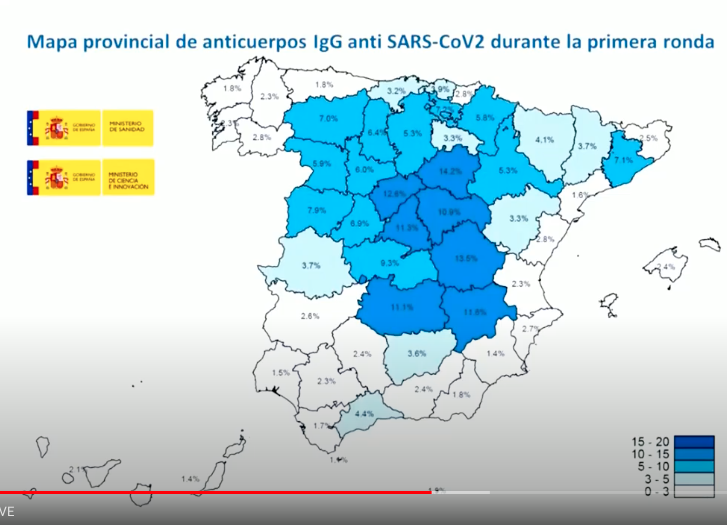

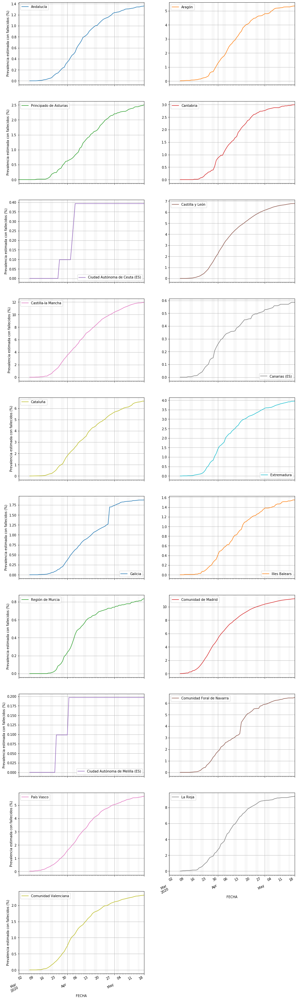

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-05-16,1.342841,5.288056,2.437541,2.965747,0.392947,6.735243,11.847563,0.570181,6.546459,3.910806,1.870065,1.528898,0.806634,11.100406,0.196798,6.449254,5.582646,9.274880,2.288121
2020-05-17,1.342841,5.288056,2.453846,2.965747,0.392947,6.759470,11.868039,0.577733,6.559676,3.910806,1.873151,1.528898,0.812236,11.120481,0.196798,6.449254,5.609431,9.328031,2.294822
2020-05-18,1.351741,5.319608,2.470150,2.980074,0.392947,6.783698,11.876230,0.585285,6.587210,3.942093,1.873151,1.535911,0.812236,11.159377,0.196798,6.449254,5.624736,9.354607,2.304872
2020-05-19,1.355696,5.344849,2.478303,2.994401,0.392947,6.783698,11.929468,0.585285,6.631264,3.942093,1.873151,1.549937,0.829041,11.181962,0.196798,6.449254,5.662999,9.381182,2.308222
2020-05-20,1.359651,5.351160,2.502760,2.994401,0.392947,6.783698,11.954039,0.585285,6.631264,3.949914,1.876237,1.549937,0.834642,11.205801,0.196798,6.487718,5.674479,9.407758,2.316597


In [27]:
porcenErrorMuertos=25
mortalidad = 1.5
axes = ((100.+porcenErrorMuertos)*(100./mortalidad)*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           #legend=poblacion.loc[fallecidos.columns,'GEO'].values,                                                                                                    
           layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Prevalencia estimada con fallecidos (%)')
        highlight_datetimes(kv.index, kaxi[0],items=False)
        highlight_datetimes(kv.index, kaxi[1],items=False)
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue
        
plt.show()

(100.+porcenErrorMuertos)*(100./mortalidad)*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1).tail()


Comparación de las CCAAs con otros pasies 
-----------------------------------------

Cantidades normalizadas por la población

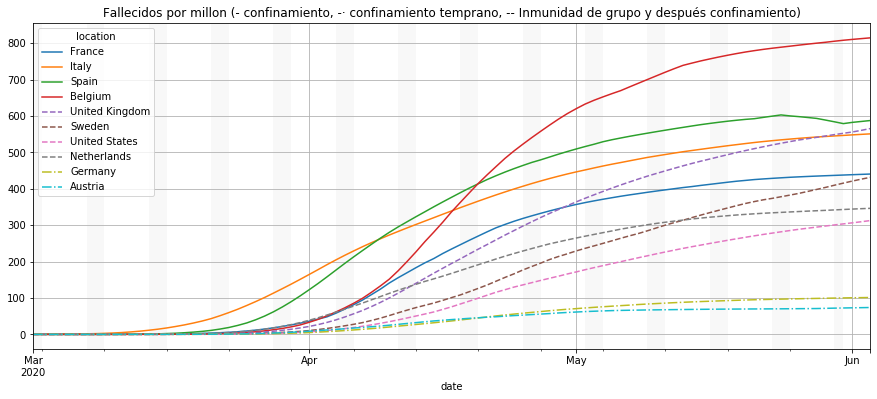

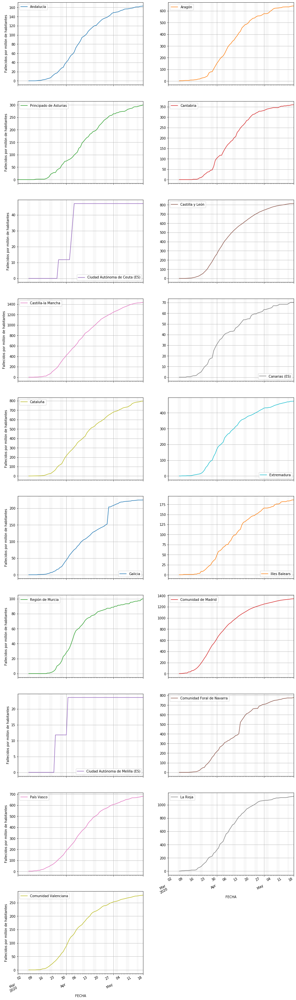

In [28]:
fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises,:],
               'total_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(kindex, ax,items=False)
plt.show()

axes = (1000000*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        highlight_datetimes(kv.index, kaxi[0],items=False)
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos por millón de habitantes')
        highlight_datetimes(kv.index, kaxi[1],items=False)
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue

plt.show()

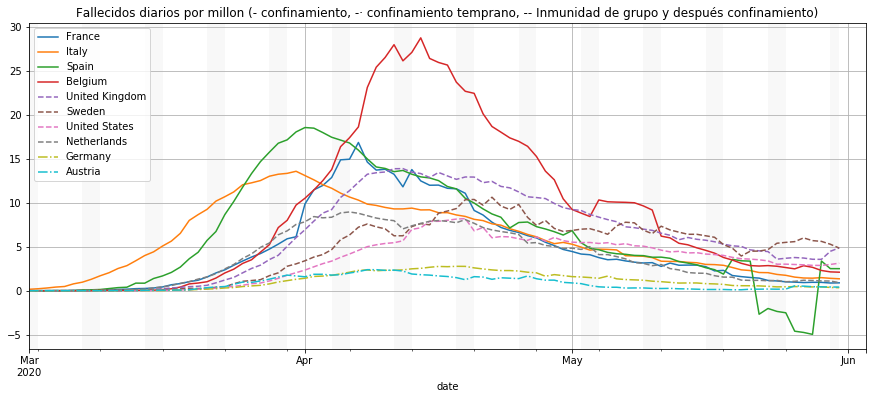

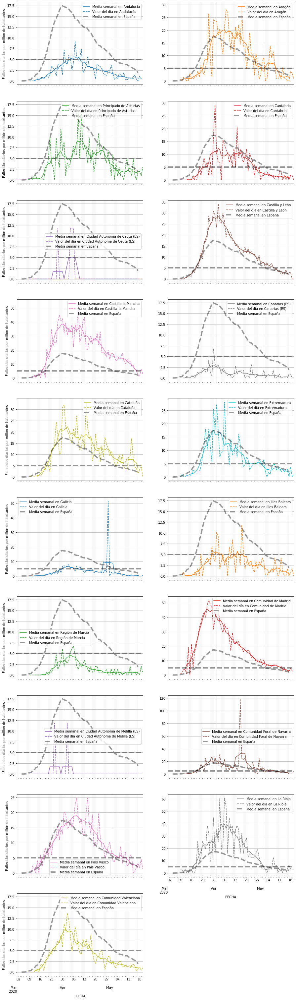

In [29]:


fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Fallecidos diarios por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)
plt.show()


ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()


axes = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').rolling(7,center=True).mean().divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
indices = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).index
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        
        highlight_datetimes(ktabla.index, kaxi[0],items=False)
        #kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos diarios por millón de habitantes')
        ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kaxi[0].get_lines()[-1].get_color())
        ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[0].axhline(y=5,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        
        kaxi[0].grid()


        highlight_datetimes(ktabla.index, kaxi[1],items=False)
        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='--',c=kaxi[1].get_lines()[-1].get_color())
        ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[1],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[1].axhline(y=5,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        kaxi[1].grid()


    except:
        continue
#kcolor = kaxi[0].get_lines()[-1].get_color()
#ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kcolor)

plt.show()

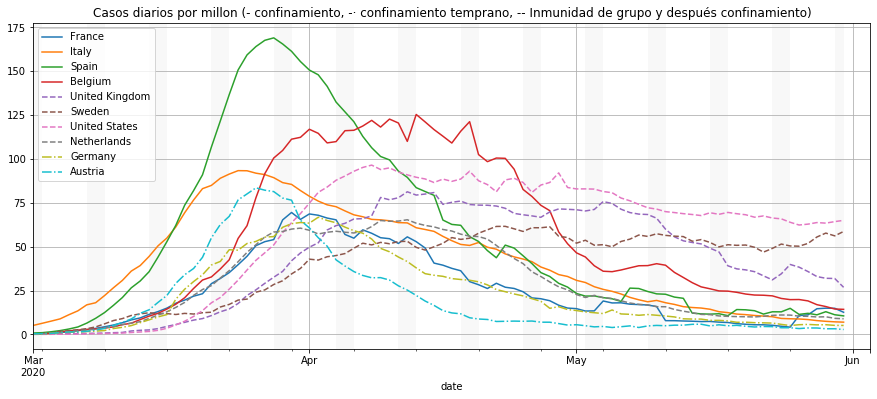

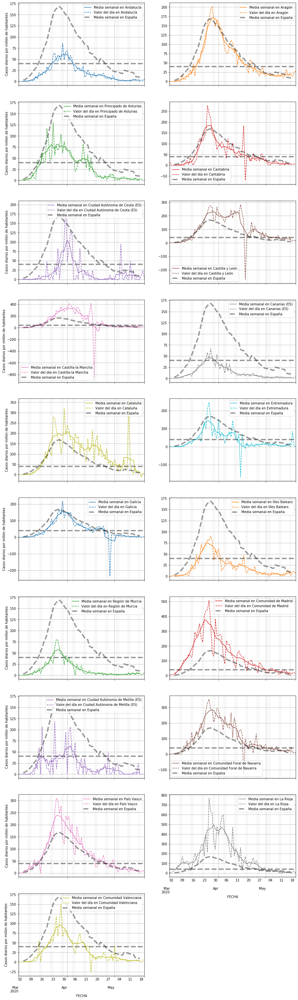

In [30]:

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'new_cases_per_million'].unstack(level=0).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Casos diarios por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)
plt.show()


ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()

 
axes = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index').rolling(7,center=True).mean().divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
indices = datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).index
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        
        highlight_datetimes(ktabla.index, kaxi[0],items=False)
        kaxi[0].set(ylabel='Casos diarios por millón de habitantes')
        ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kaxi[0].get_lines()[-1].get_color())
        ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[0].axhline(y=40,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        #owid_covid.loc[idx[lpaises,:],
        #       'new_cases_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],'Spain'].plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)


        kaxi[0].grid()


        highlight_datetimes(ktabla.index, kaxi[1],items=False)
        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='--',c=kaxi[1].get_lines()[-1].get_color())
        ktabla[[u'España']].rolling(7,center=True).mean().plot(ax=kaxi[1],ls='--',linewidth=4, color='k',alpha=.4)
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[1].axhline(y=40,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        kaxi[1].grid()


    except:
        continue

plt.show()    


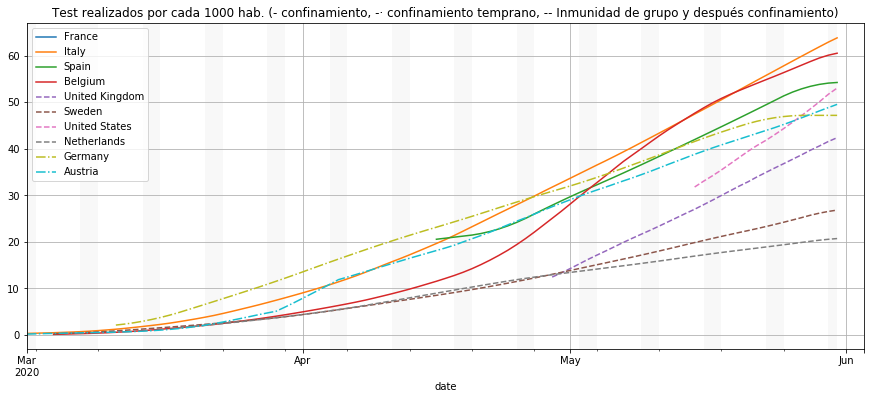

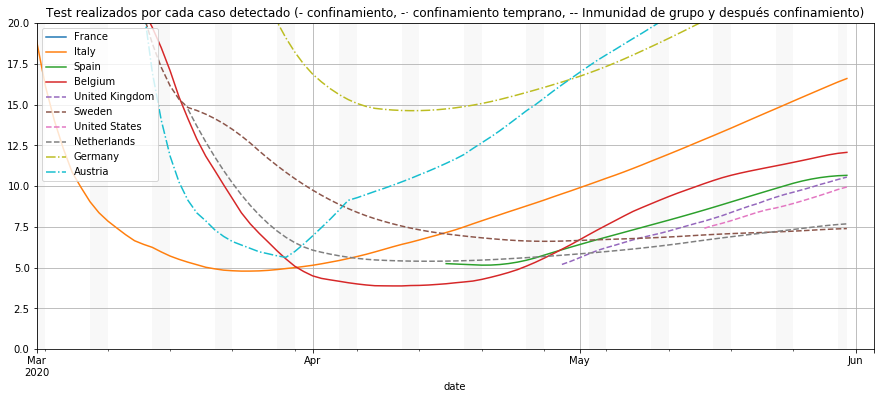

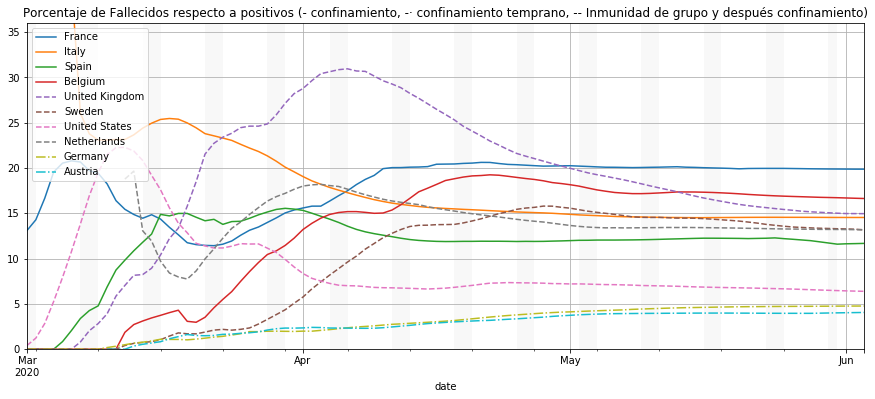

In [31]:

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'total_tests_per_thousand'].unstack(level=0).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Test realizados por cada 1000 hab. (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)
plt.show()

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'total_tests'].unstack(level=0).divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].unstack(level=0)).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Test realizados por cada caso detectado (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)

#plt.yscale('log')

plt.ylim(0,20)
plt.grid()
plt.show()

diasRetraso = 7
fig, ax = plt.subplots(figsize=(15,6))
(100*owid_covid.loc[idx[lpaises,:],
               'total_deaths'].unstack(level=0).divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].unstack(level=0).shift(diasRetraso)).interpolate('index').rolling(7,center=False).mean()).loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Porcentaje de Fallecidos respecto a positivos (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)

#plt.yscale('log')
plt.ylim(0,36)
plt.grid()
plt.show()

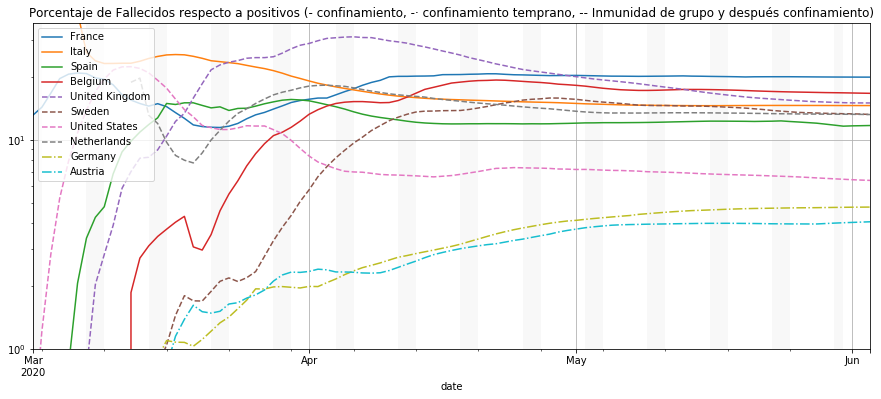

In [32]:
diasRetraso = 7
fig, ax = plt.subplots(figsize=(15,6))
(100*owid_covid.loc[idx[lpaises,:],
               'total_deaths'].unstack(level=0).divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].unstack(level=0).shift(diasRetraso)).interpolate('index').rolling(7,center=False).mean()).loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Porcentaje de Fallecidos respecto a positivos (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=False)

plt.yscale('log')
plt.ylim(1,36)
plt.grid()
plt.show()

In [33]:
owid_covid.columns

Index(['iso_code', 'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
       'total_cases_per_million', 'new_cases_per_million',
       'total_deaths_per_million', 'new_deaths_per_million', 'total_tests',
       'new_tests', 'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_100k'],
      dtype='object')

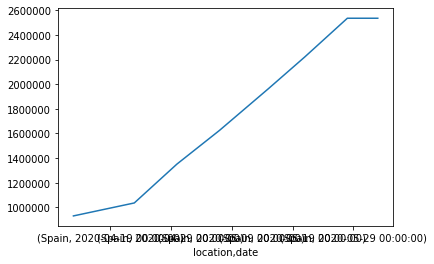

In [34]:
owid_covid.loc[idx['Spain',:],'total_tests'].interpolate().plot()

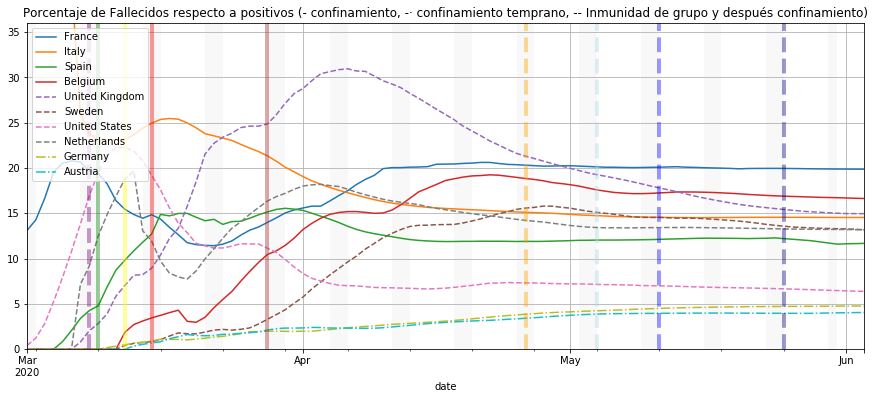

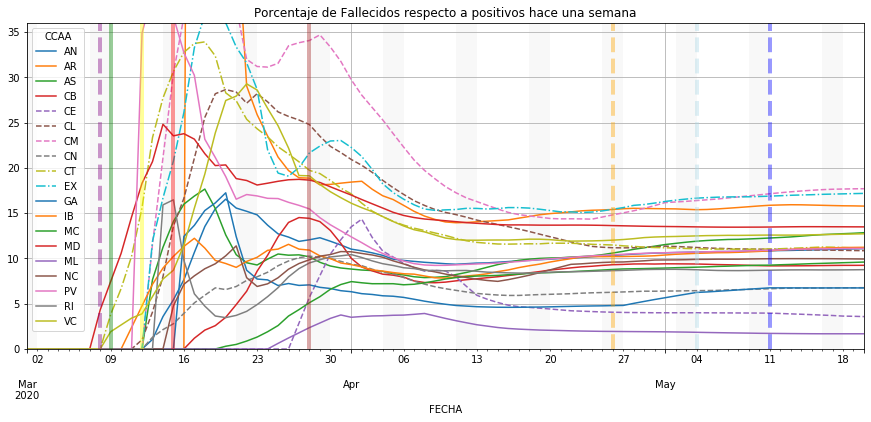

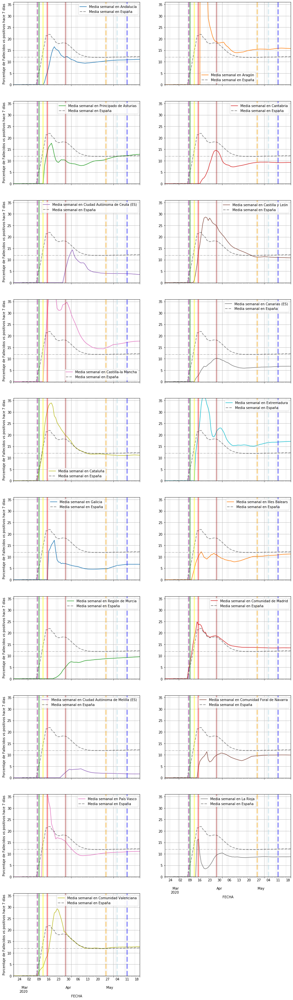

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC,España
FECHA,,,,,,,,,,,,,,,,,,,,
2020-05-16,10.963512,15.860489,12.622811,9.207645,3.743242,10.923770,17.587302,6.732690,11.258240,17.071391,6.740626,11.136193,9.452324,13.497353,1.680672,9.968541,11.058506,8.725947,12.626736,12.274795
2020-05-17,10.989061,15.832284,12.675369,9.223213,3.696952,10.904206,17.633944,6.743159,11.235091,17.097349,6.741524,11.165955,9.486893,13.491290,1.680672,9.963897,11.075678,8.729135,12.646251,12.144881
2020-05-18,11.020749,15.807837,12.726949,9.232199,3.632434,10.886810,17.657976,6.752580,11.202930,17.124557,6.742769,11.197197,9.525021,13.488030,1.680672,9.951295,11.090958,8.734174,12.669881,12.149308
2020-05-19,11.049887,15.796282,12.773786,9.232304,3.609441,10.868602,17.678586,6.760712,11.161930,17.151171,6.743396,11.211551,9.557251,13.483320,1.680672,9.940826,11.103383,8.742955,12.692662,12.161432
2020-05-20,11.077657,15.772878,12.838061,9.236583,3.577805,10.849066,17.692985,6.768860,11.091938,17.174573,6.739434,11.224316,9.595178,13.480561,1.680672,9.929093,11.104742,8.755609,12.714544,12.156441


In [35]:
fig, ax = plt.subplots(figsize=(15,6))
(100*owid_covid.loc[idx[lpaises,:],
               'total_deaths'].divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].shift(diasRetraso)).unstack(level=0).interpolate('index').rolling(7,center=False).mean()).loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Porcentaje de Fallecidos respecto a positivos (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(kindex, ax,items=True)

#plt.yscale('log')
plt.ylim(0,36)
plt.grid()
plt.show()

ktabla = (100*datos.Fallecidos.unstack(level=1).fillna(0).divide(
    datos.Total.unstack(level=1).shift(diasRetraso))).rolling(7,center=False).mean()#.loc[idx['2020-03-01':],:]
#ktabla = 100. * (datos.Fallecidos /
#    datos.Total.shift(diasRetraso)).unstack(level=1)
#ktabla = ktabla.fillna(0)
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.loc[idx['2020-03-01':],:].plot(ax=ax,style=llines)
plt.title('Porcentaje de Fallecidos respecto a positivos hace una semana')
highlight_datetimes(kindex, ax,items=True)

#plt.yscale('log')
plt.ylim(0,36)
plt.grid()
plt.show()

#ktabla = ktabla.loc[idx['2020-03-01':,:]]

axes = ktabla.plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
ktabla.loc[:,u'España']= 100*datos.Fallecidos.unstack(level=1).sum(axis=1).divide(
    datos.Total.unstack(level=1).shift(diasRetraso).sum(axis=1)).loc[idx['2020-03-01':]]
ktabla = ktabla.fillna(0)

for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        
        
        kaxi[0].set(ylabel='Porcentaje de Fallecidos vs positivos hace 7 días')
        #ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kaxi[0].get_lines()[-1].get_color())
        ktabla[u'España'].interpolate('index').rolling(7,center=False).mean().plot(ax=kaxi[0],ls='--',linewidth=2, color='k',alpha=.4)
        
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         #'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[0].axhline(y=12,ls='-.',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')
        #owid_covid.loc[idx[lpaises,:],
        #       'new_cases_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],'Spain'].plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)

        highlight_datetimes(kv.index, kaxi[0],items=True)
        kaxi[0].grid()
        kaxi[0].set_ylim(0,36)


        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        #ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='--',c=kaxi[1].get_lines()[-1].get_color())
        ktabla[[u'España']].interpolate('index').rolling(7,center=False).mean().plot(ax=kaxi[1],ls='--',linewidth=2, color='k',alpha=.4)
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         #'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[1].axhline(y=12,ls='-.',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')
        highlight_datetimes(kv.index, kaxi[1],items=True)
        kaxi[1].grid()
        kaxi[1].set_ylim(0,36)


    except:
        continue

plt.show()    
ktabla.tail()

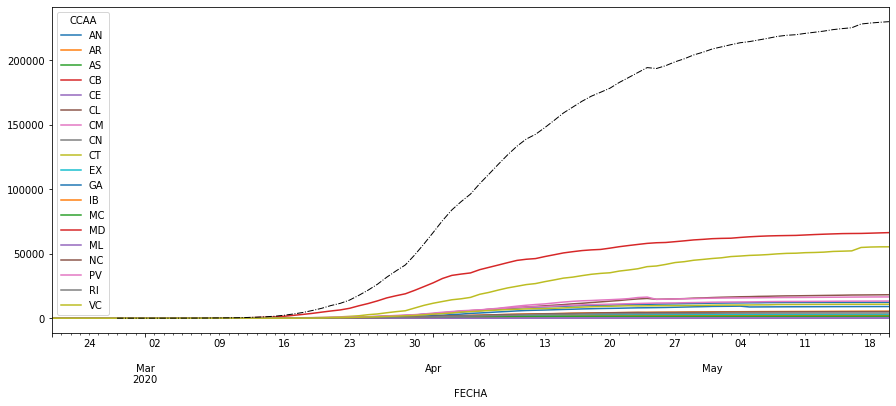

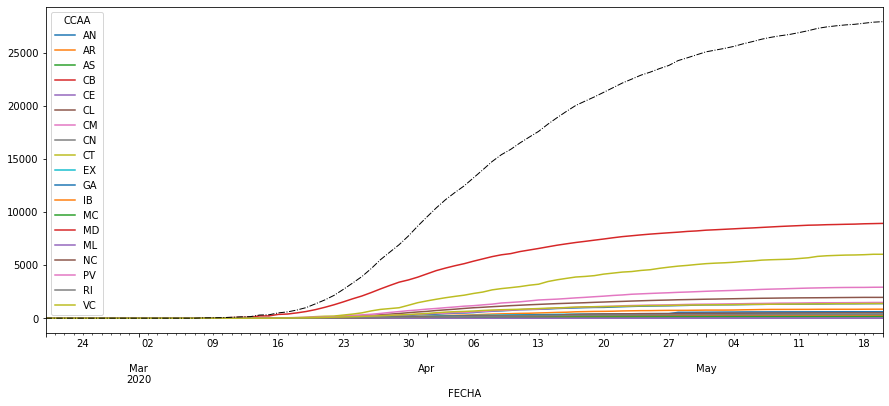

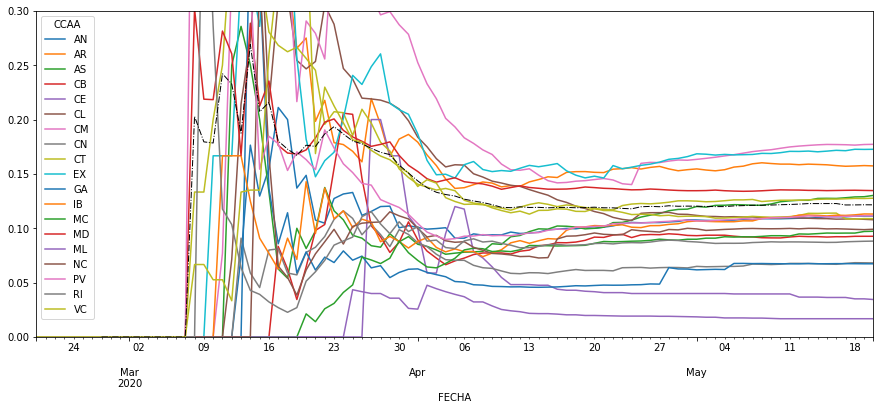

In [36]:
ktabla = datos.Total.unstack(level=1).shift(diasRetraso)#.divide(
    #datos.Total.unstack(level=1).shift(diasRetraso)) 
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.plot(ax=ax)
(kv.Total.shift(diasRetraso)).plot(ls='-.',linewidth=1, color='k',ax=ax)
#plt.ylim(0,.3)
plt.show()

ktabla = datos.Fallecidos.unstack(level=1)#.divide(
    #datos.Total.unstack(level=1).shift(diasRetraso))
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.plot(ax=ax)
(kv.Fallecidos).plot(ls='-.',linewidth=1, color='k',ax=ax)
#plt.ylim(0,.3)
plt.show()

ktabla = datos.Fallecidos.unstack(level=1).divide(
    datos.Total.unstack(level=1).shift(diasRetraso))
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.plot(ax=ax)
(kv.Fallecidos/kv.Total.shift(diasRetraso)).plot(ls='-.',linewidth=1, color='k',ax=ax)
plt.ylim(0,.3)
plt.show()

In [37]:
ktabla.head(30)

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-02-20,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-21,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-22,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-23,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-24,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-25,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-26,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-27,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-28,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000


In [38]:
poblacion.Value.sum()

46937060

In [39]:
pd.read_html("https://docs.google.com/spreadsheets/d/e/2PACX-1vTkBWFjZ4hR39nf9QgPK2qDjiw_GriXoPPIluGas731ioIdmQhQthiJPUHl-ADibkZPT2KvFn4WvBrv/pubhtml#")[0]

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,1.0,id_mapa,id_pdf,ccaa,poblacion,escala,30/05/2020,31/05/2020,01/06/2020,02/06/2020,31/05/2020,01/06/2020,02/06/2020
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.0,1,1,AndalucÃ­a,8446561,3,157,159,172,178,002,013,006
3,3.0,2,2,AragÃ³n,1324397,1,1721,1652,1546,1516,-069,-106,-030
4,4.0,3,3,Asturias,1019993,1,372,352,323,313,-020,-029,-010
5,5.0,4,4,Baleares,1198576,1,592,583,522,505,-009,-061,-017
6,6.0,5,5,Canarias,2220270,2,274,279,293,265,005,014,-028
7,7.0,6,6,Cantabria,581949,2,688,654,688,620,-034,034,-068
8,8.0,8,7,Castilla-La Mancha,2038440,2,2160,2199,2223,2115,039,024,-108
9,9.0,7,8,Castilla y LeÃ³n,2402877,2,2463,2584,2492,2388,121,-092,-104


In [40]:
pd.read_csv('https://github.com/datadista/datasets/raw/master/COVID%2019/ccaa_covid19_confirmados_test.csv')

,cod_ine,CCAA,2020-02-21,2020-02-22,2020-02-23,2020-02-24,2020-02-25,2020-02-26,2020-02-27,2020-02-28,...,2020-05-12,2020-05-13,2020-05-14,2020-05-15,2020-05-16,2020-05-17,2020-05-18,2020-05-19,2020-05-20,2020-05-21
0,1,Andalucía,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3229,3312,3464,3667,3843,3982,3999,3999,3999,3999
1,2,Aragón,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1438,1484,1554,1583,1669,1699,1698,1751,1751,1751
2,3,Asturias,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,875,896,910,936,961,978,985,985,985,985
3,4,Baleares,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,105,106,106,106,105,105,105,106,106,107
4,5,Canarias,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
5,6,Cantabria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,445,477,483,498,505,505,503,509,510,519
6,8,Castilla La Mancha,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7620,7732,7861,8014,8189,8290,8366,8397,8546,8634
7,7,Castilla y León,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6122,6157,6206,6226,6226,6226,6234,6285,6290,6291
8,9,Cataluña,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1643,1643,1643,1643,1643,1643,1643,1643,1643,1643
9,18,Ceuta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,59,59,59,59,59,59,59,59,59,59


In [41]:
Escovid19data = pd.read_csv('https://raw.githubusercontent.com/montera34/escovid19data/master/data/output/covid19-provincias-spain_consolidated.csv',
            index_col=[0,1],
            parse_dates=[0],
            infer_datetime_format=True,
            
           )

In [42]:
Escovid19data.tail().T

date                                                               2020-06-03  \
province                                                               Teruel   
ine_code                                                                   44   
ccaa                                                                   Aragón   
new_cases                                                                 NaN   
PCR                                                                       NaN   
TestAc                                                                    NaN   
activos                                                                   NaN   
hospitalized                                                               12   
intensive_care                                                            NaN   
deceased                                                                   89   
cases_accumulated                                                         NaN   
cases_accumulated_PCR                                                     618   
recovered                                                                 393   
poblacion                                                              134137   
cases_per_cienmil                                                         NaN   
intensive_care_per_1000000                                                NaN   
deceassed_per_100000                                                    66.35   
hospitalized_per_100000                                                  8.95   
cases_14days                                                              NaN   
cases_7days                                                               NaN   
daily_cases                                                               NaN   
daily_cases_avg7                                                          NaN   
daily_cases_PCR                                                             0   
daily_cases_PCR_avg7                                                      1.1   
daily_deaths                                                                0   
daily_deaths_inc                                                            0   
daily_deaths_avg3                                                         1.3   
daily_deaths_avg7                                                         0.6   
deaths_last_week                                                            4   
source_name                                      Gobierno de Aragón;aragon.es   
source                      http://www.aragonhoy.net/index.php/mod.noticia...   
comments                                                                  NaN   

date                                                                           \
province                                                               Toledo   
ine_code                                                                   45   
ccaa                                                     Castilla - La Mancha   
new_cases                                                                 NaN   
PCR                                                                         6   
TestAc                                                                    NaN   
activos                                                                   NaN   
hospitalized                                                               27   
intensive_care                                                            NaN   
deceased                                                                  784   
cases_accumulated                                                         NaN   
cases_accumulated_PCR                                                    4025   
recovered                                                                2098   
poblacion                                                              694844   
cases_per_cienmil                                                         NaN   
intensive_care_per_1000000    

In [43]:
Escovid19data.xs('Barcelona',level='province').tail(4).T

date,2020-05-30,2020-05-31,2020-06-01,2020-06-02
ine_code,8,8,8,8
ccaa,Cataluña,Cataluña,Cataluña,Cataluña
new_cases,NaN,NaN,NaN,NaN
PCR,39,12,17,8
TestAc,3,2,5,17
activos,NaN,NaN,NaN,NaN
hospitalized,NaN,NaN,NaN,NaN
intensive_care,NaN,NaN,NaN,NaN
deceased,6251,6260,6276,NaN
cases_accumulated,49353,49367,49389,49414


In [44]:
Escovid19data.groupby(['date','ccaa']).sum().xs('Aragón',level='ccaa').tail(10).T

date,2020-05-25,2020-05-26,2020-05-27,2020-05-28,2020-05-29,2020-05-30,2020-05-31,2020-06-01,2020-06-02,2020-06-03
ine_code,116.00,116.00,116.00,116.00,116.00,116.00,116.00,116.00,116.00,116.00
new_cases,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
PCR,4.00,13.00,9.00,8.00,7.00,7.00,6.00,3.00,5.00,6.00
TestAc,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
activos,1055.00,655.00,631.00,610.00,574.00,541.00,545.00,528.00,508.00,514.00
hospitalized,118.00,114.00,107.00,93.00,86.00,84.00,76.00,74.00,75.00,81.00
intensive_care,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
deceased,857.00,857.00,858.00,861.00,861.00,861.00,861.00,861.00,868.00,868.00
cases_accumulated,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
cases_accumulated_PCR,5580.00,5602.00,5617.00,5634.00,5650.00,5659.00,5668.00,5674.00,5681.00,5701.00


In [45]:
Escovid19data.columns

Index(['ine_code', 'ccaa', 'new_cases', 'PCR', 'TestAc', 'activos',
       'hospitalized', 'intensive_care', 'deceased', 'cases_accumulated',
       'cases_accumulated_PCR', 'recovered', 'poblacion', 'cases_per_cienmil',
       'intensive_care_per_1000000', 'deceassed_per_100000',
       'hospitalized_per_100000', 'cases_14days', 'cases_7days', 'daily_cases',
       'daily_cases_avg7', 'daily_cases_PCR', 'daily_cases_PCR_avg7',
       'daily_deaths', 'daily_deaths_inc', 'daily_deaths_avg3',
       'daily_deaths_avg7', 'deaths_last_week', 'source_name', 'source',
       'comments'],
      dtype='object')

In [46]:
kk = Escovid19data['daily_deaths'].index

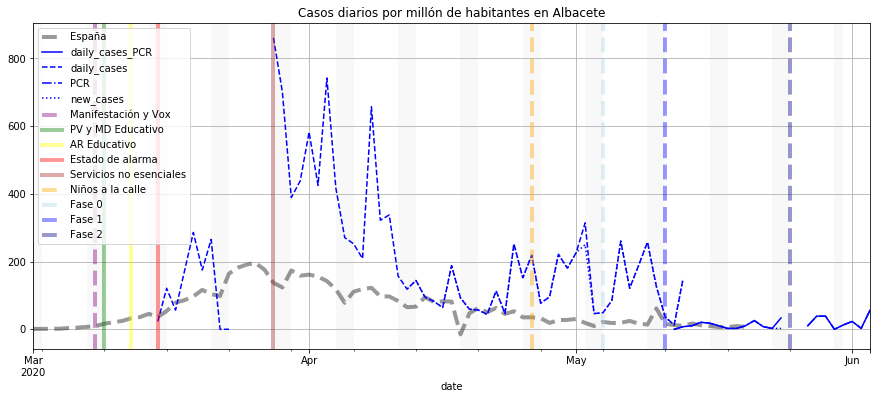

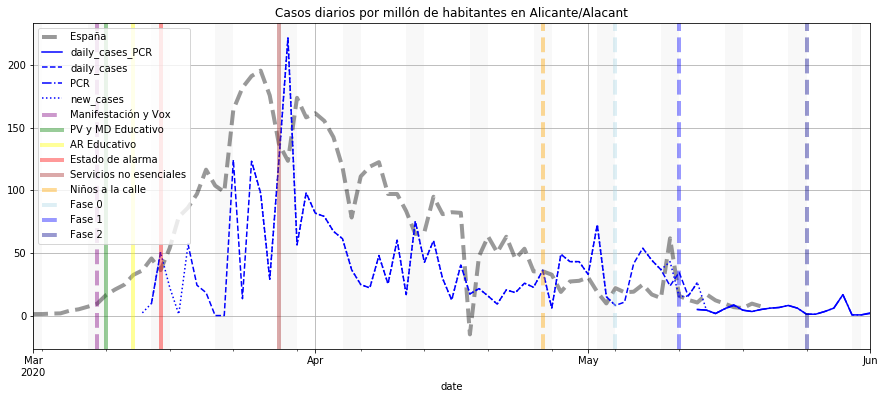

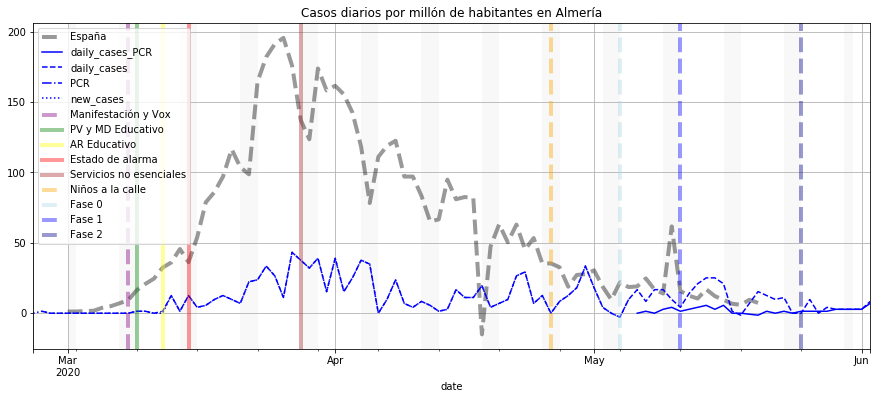

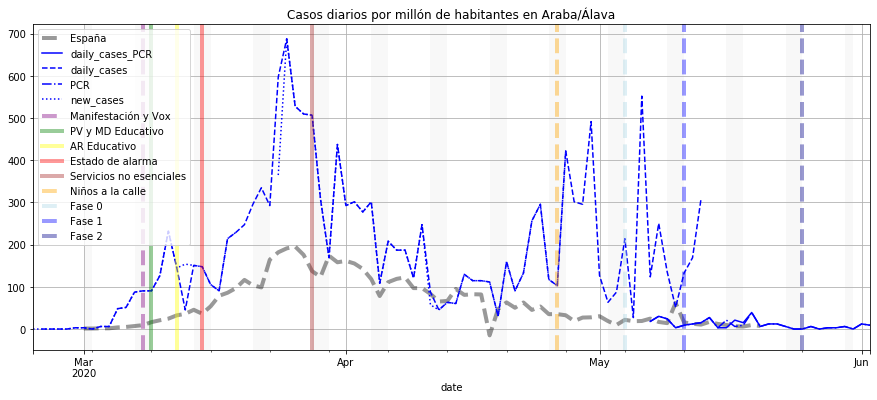

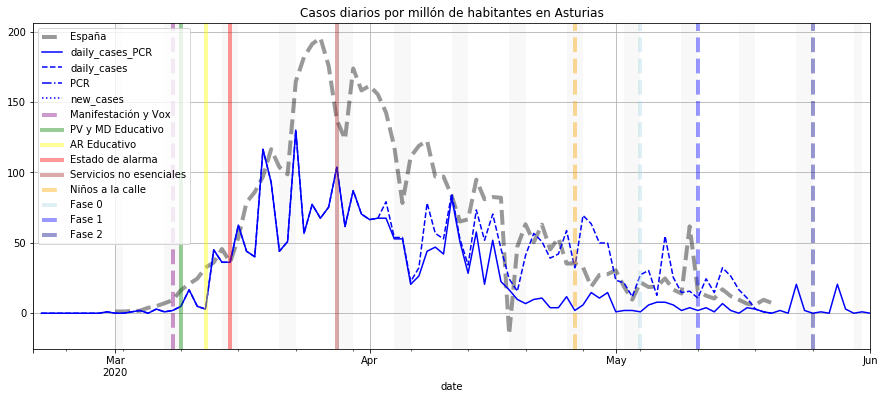

...

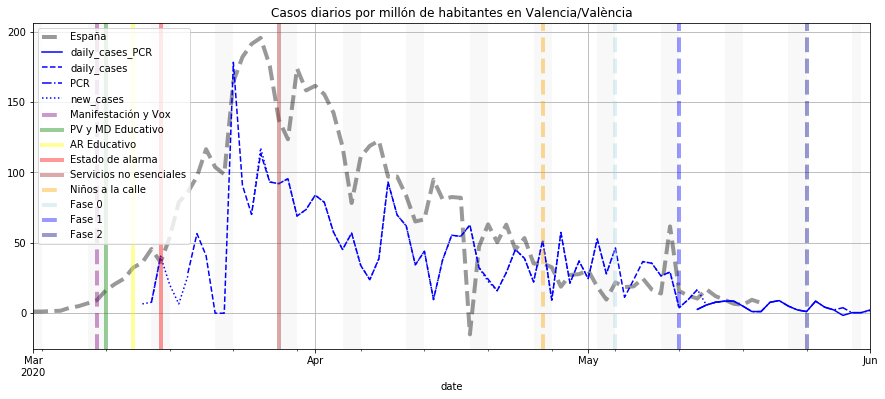

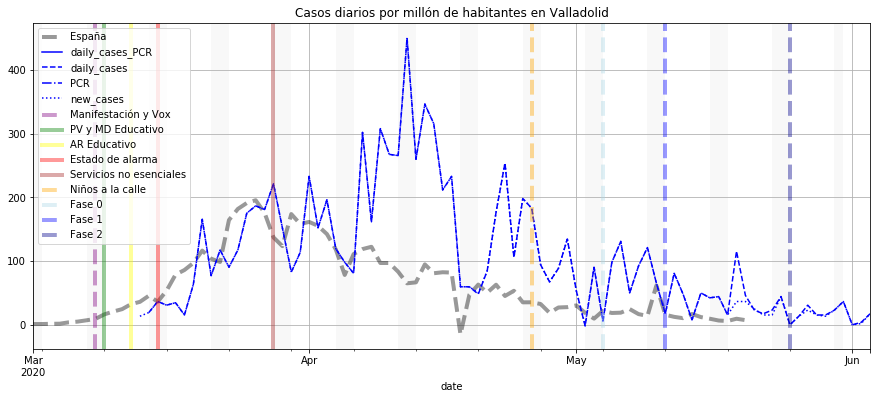

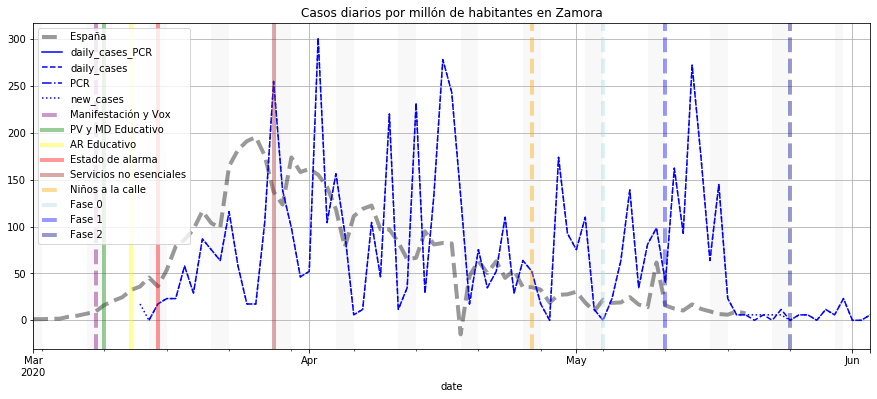

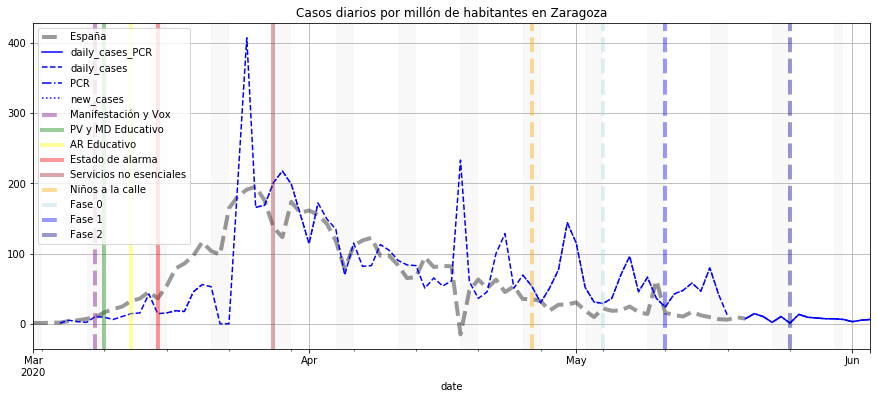

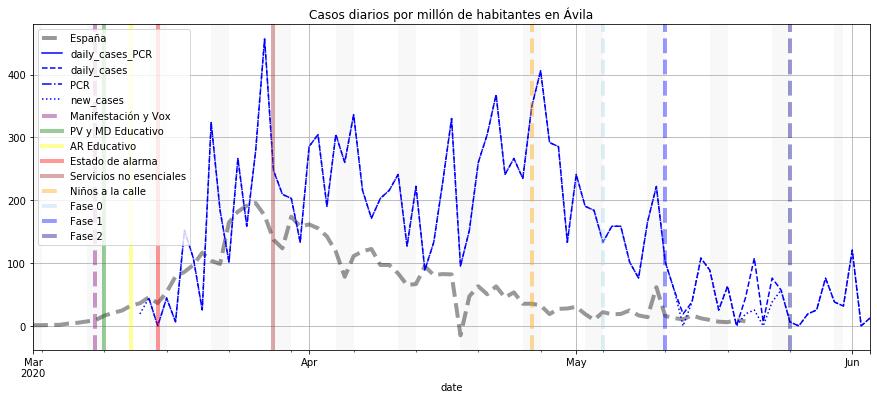

In [47]:
ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()


for k in kk.levels[1]:
    

    fig, ax = plt.subplots(figsize=(15,6))
    #ktabla[u'España'].rolling(7,center=True).mean().plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    ktabla[u'España'].plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    
    (1000000 * Escovid19data.xs(k,level='province')[['daily_cases_PCR']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax,c='b')
    (1000000 * Escovid19data.xs(k,level='province')[['daily_cases']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax,ls='--',c='b')
    (1000000 * Escovid19data.xs(k,level='province')[['PCR']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax,ls='-.',c='b')
    (1000000 * Escovid19data.xs(k,level='province')[['new_cases']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax,ls='dotted',c='b')

    
    #(kv.Fallecidos).plot(ls='-.',linewidth=1, color='k',ax=ax)
    #plt.ylim(0,.3)
    
    plt.title('Casos diarios por millón de habitantes en {}'.format(k))
    highlight_datetimes(kindex, ax,items=True)

    plt.legend(loc='upper left')
    #plt.yscale('log')
    #plt.ylim(0,36)
    plt.grid()
    plt.show()


    plt.show()

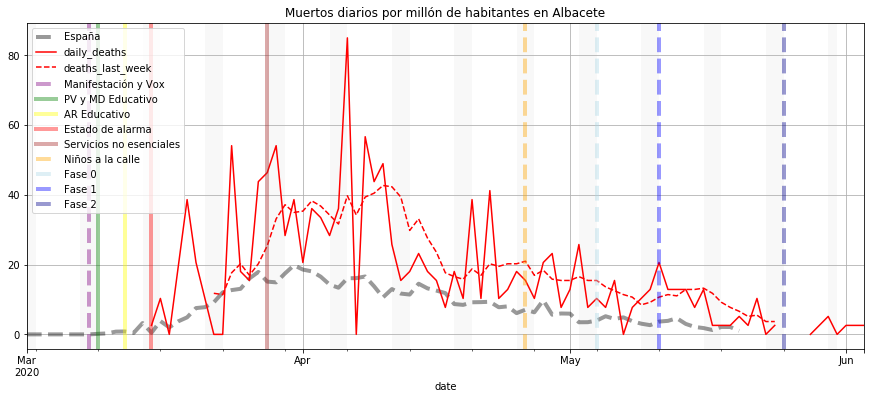

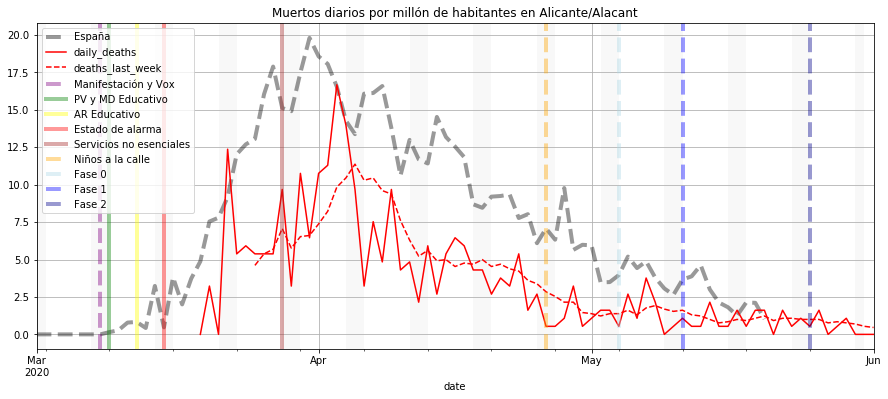

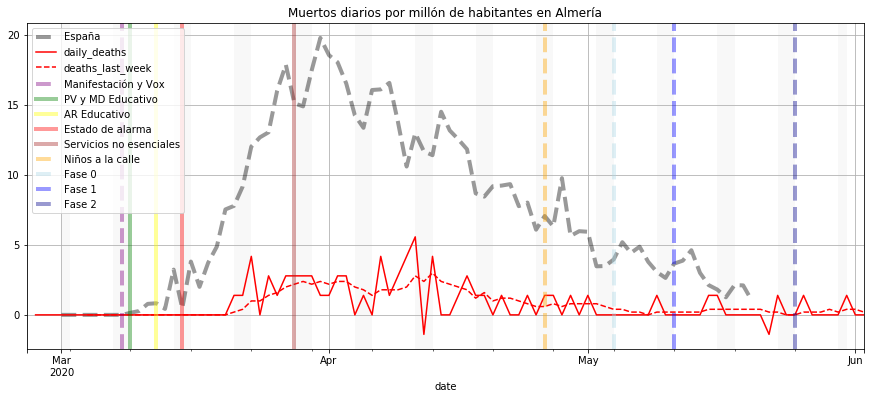

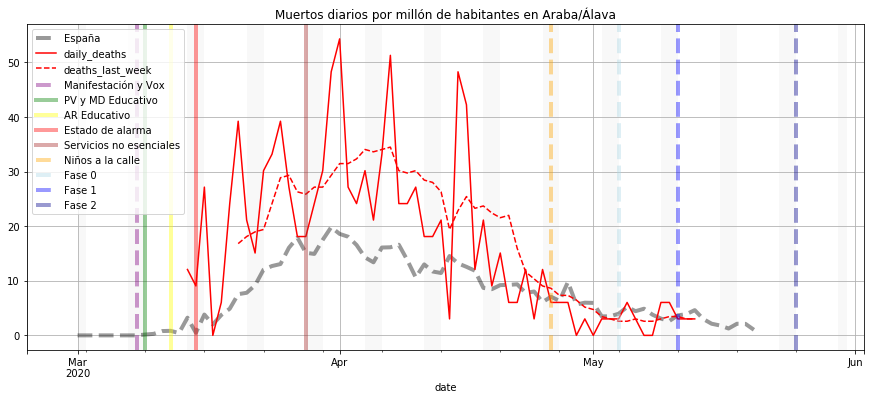

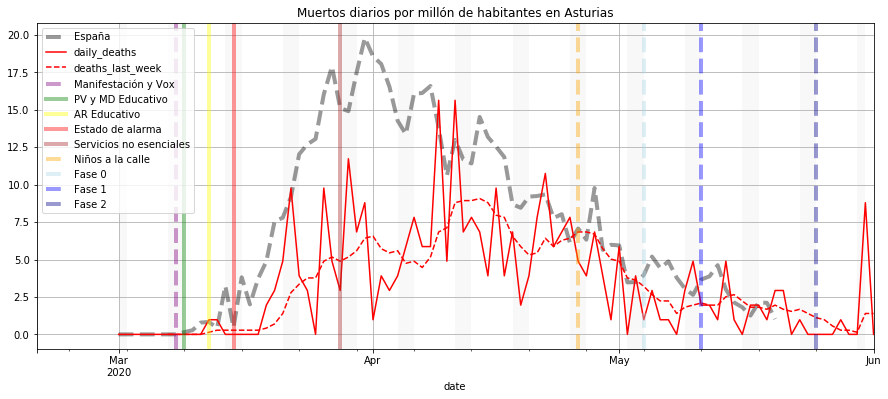

...

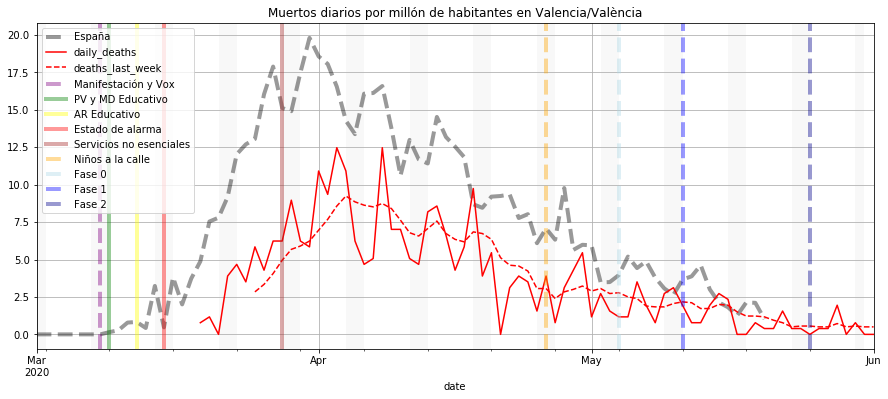

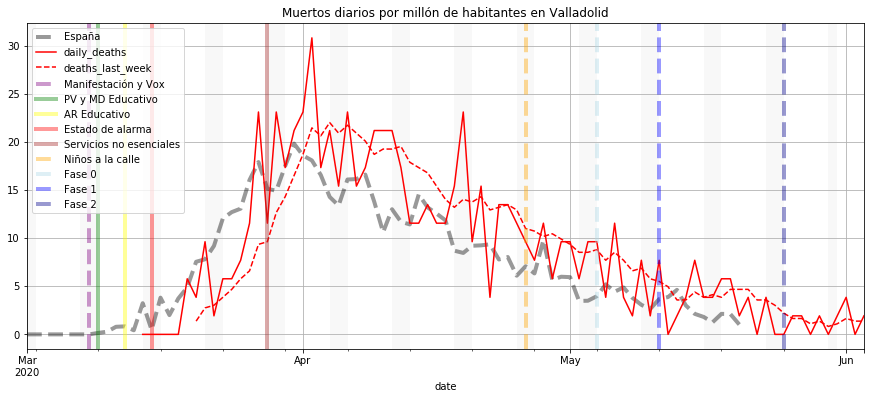

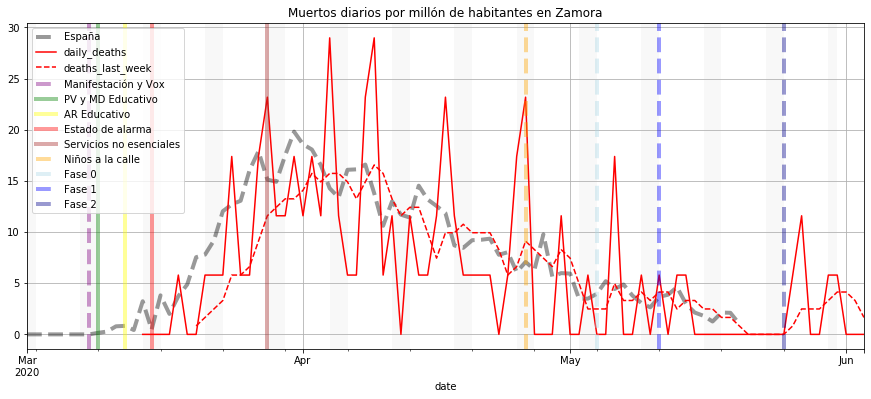

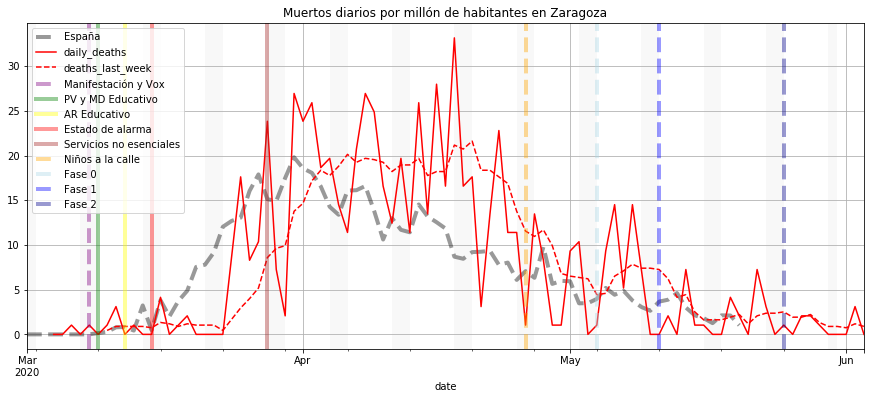

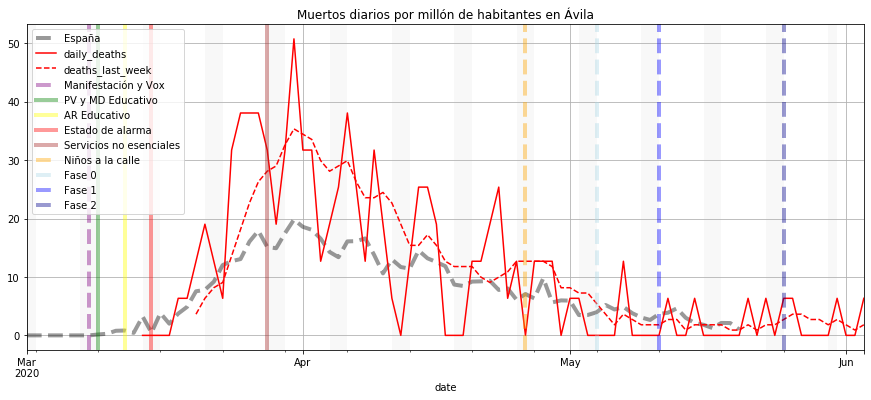

In [48]:
ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()


for k in kk.levels[1]:
    

    fig, ax = plt.subplots(figsize=(15,6))
    #ktabla[u'España'].rolling(7,center=True).mean().plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    ktabla[u'España'].plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    
    (1000000 * Escovid19data.xs(k,level='province')[['daily_deaths']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax,c='r')
    (1000000 * Escovid19data.xs(k,level='province')[['deaths_last_week']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]/7.).plot(ax=ax,c='r',ls='--')
    #(kv.Fallecidos).plot(ls='-.',linewidth=1, color='k',ax=ax)
    #plt.ylim(0,.3)
    
    plt.title('Muertos diarios por millón de habitantes en {}'.format(k))
    highlight_datetimes(kindex, ax,items=True)
    plt.legend(loc='upper left')

    #plt.yscale('log')
    #plt.ylim(0,36)
    plt.grid()
    plt.show()



In [49]:
momo = pd.read_csv('https://momo.isciii.es/public/momo/data',
            parse_dates=['fecha_defuncion'],
            index_col='fecha_defuncion',
            infer_datetime_format=True,)

momo.loc[:,'exceso_mortalidad'] = (momo.defunciones_observadas - momo.defunciones_esperadas).clip(lower=0)



In [50]:
momo[momo.cod_ambito == 'AR'].tail()

,ambito,cod_ambito,cod_ine_ambito,nombre_ambito,cod_sexo,nombre_sexo,cod_gedad,nombre_gedad,defunciones_observadas,defunciones_observadas_lim_inf,defunciones_observadas_lim_sup,defunciones_esperadas,defunciones_esperadas_q01,defunciones_esperadas_q99,exceso_mortalidad
fecha_defuncion,,,,,,,,,,,,,,,
2020-05-30,ccaa,AR,2.0,Aragón,6,mujeres,mas_74,edad > 75,12,12.000000,12.326719,12.0,4.69,20.24,0.0
2020-05-31,ccaa,AR,2.0,Aragón,6,mujeres,mas_74,edad > 75,13,13.000000,14.424866,12.0,4.69,20.24,1.0
2020-06-01,ccaa,AR,2.0,Aragón,6,mujeres,mas_74,edad > 75,7,6.585409,7.664768,13.0,4.69,20.24,0.0
2020-06-02,ccaa,AR,2.0,Aragón,6,mujeres,mas_74,edad > 75,10,8.996708,11.335756,13.0,4.69,24.24,0.0
2020-06-03,ccaa,AR,2.0,Aragón,6,mujeres,mas_74,edad > 75,14,8.719779,20.682674,12.5,5.38,20.79,1.5


In [51]:
momoNac = momo[(momo.ambito == 'nacional')&((momo.cod_sexo=='all')&(momo.cod_gedad=='all'))].loc['2020-02-14':]
#momoNac.loc[:,'exceso_mortalidad'] = (momoNac.defunciones_observadas - momoNac.defunciones_esperadas).clip(lower=0)
#momo[(momo.cod_ambito == 'MD')&((momo.cod_sexo=='all')&(momo.cod_gedad=='all'))].loc['14/02/2020':]


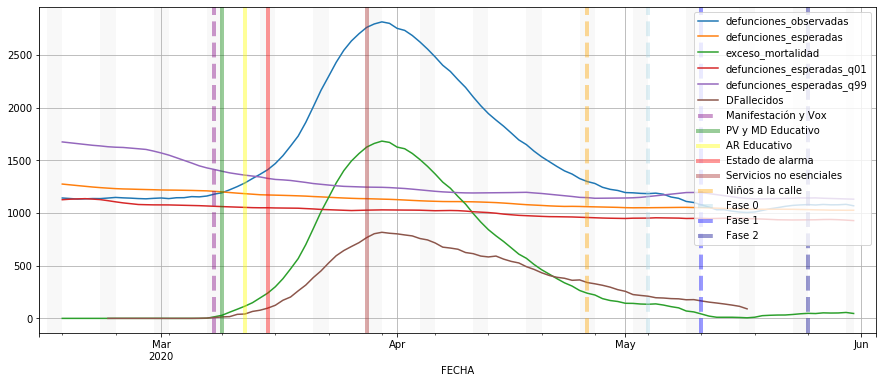

In [52]:

fig, ax = plt.subplots(figsize=(15,6))
momoNac.loc['14/02/2020':,['defunciones_observadas','defunciones_esperadas','exceso_mortalidad',
       'defunciones_esperadas_q01', 'defunciones_esperadas_q99']].rolling(7,center=True).mean().plot(ax=ax)
datos.groupby('FECHA').sum().DFallecidos.rolling(7,center=True).mean().plot()
highlight_datetimes(momoNac.index, ax,items=True)
plt.legend(loc='best')

#plt.yscale('log')
#plt.ylim(0,36)
plt.grid()
plt.show()

In [53]:
(momoNac.defunciones_observadas-momoNac.defunciones_esperadas).loc['13-03-2020':'22-05-2020'].sum()


43262.5

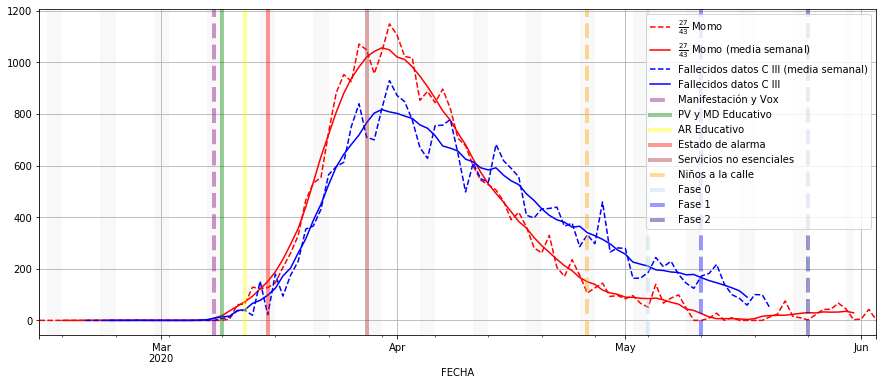

In [54]:
fig, ax = plt.subplots(figsize=(15,6))

(27/43*(momoNac.loc['01/03/2020':,'exceso_mortalidad'])).plot(ax=ax,c='r',ls='--',label=r'$\frac{27}{43}$ Momo')
(27/43*(momoNac.rolling(7,center=True).mean().loc['01/03/2020':,'exceso_mortalidad'])).plot(ax=ax,c='r',ls='-',label=r'$\frac{27}{43}$ Momo (media semanal)')
(datos.groupby('FECHA').sum().DFallecidos.loc['01/03/2020':]).plot(ax=ax,c='b',ls='--',label='Fallecidos datos C III (media semanal)')
(datos.groupby('FECHA').sum().DFallecidos.rolling(7,center=True).mean().loc['01/03/2020':]).plot(ax=ax,c='b',ls='-',label='Fallecidos datos C III')
highlight_datetimes(momoNac.index, ax,items=True)
plt.legend(loc='best')

#plt.yscale('log')
#plt.ylim(0,36)
plt.grid()
plt.show()

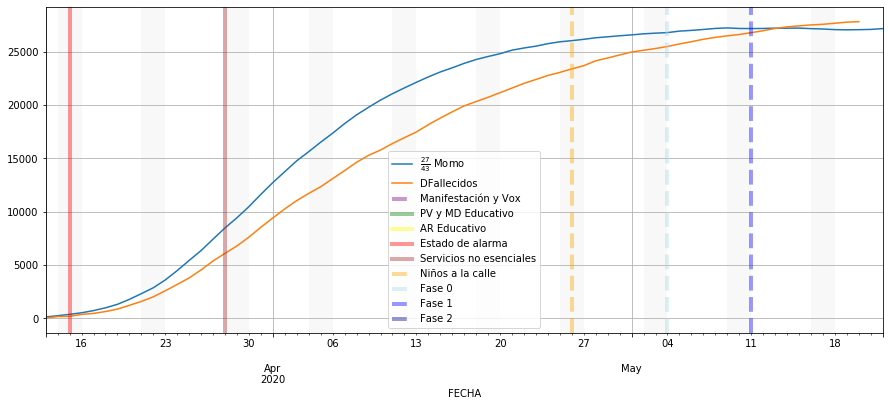

In [55]:
fig, ax = plt.subplots(figsize=(15,6))

(27/43*(momoNac.loc['13-03-2020':'22-05-2020','defunciones_observadas'] -
    momoNac.loc['13-03-2020':'22-05-2020','defunciones_esperadas'])).cumsum().plot(ax=ax,label=r'$\frac{27}{43}$ Momo')
(datos.groupby('FECHA').sum().DFallecidos.loc['13-03-2020':'22-05-2020']).cumsum().plot(ax=ax)
highlight_datetimes(momoNac.index, ax,items=True)
plt.legend(loc='best')

#plt.yscale('log')
#plt.ylim(0,36)
plt.grid()
plt.show()

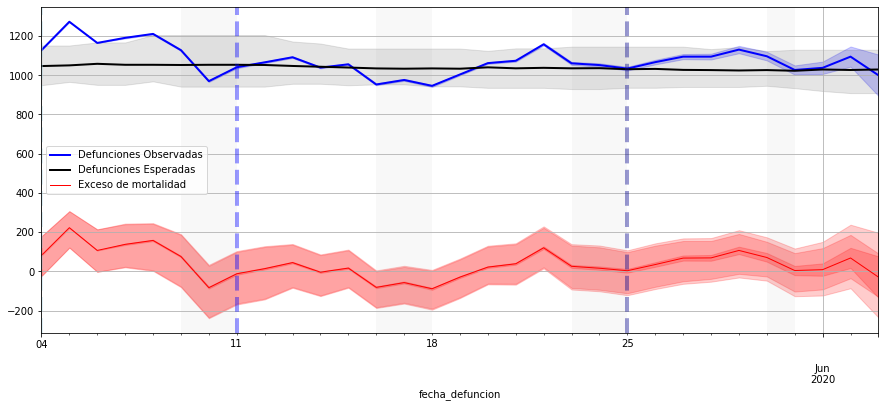

In [56]:
ultimos = 31
kvv = momoNac[['defunciones_observadas',
       'defunciones_observadas_lim_inf', 'defunciones_observadas_lim_sup',
       'defunciones_esperadas', 'defunciones_esperadas_q01',
       'defunciones_esperadas_q99', 'exceso_mortalidad']].tail(ultimos)#+1).head(ultimos)

fig, ax = plt.subplots(figsize=(15,6))
kvv.defunciones_observadas.plot(ax=ax,c='b',lw=2,label='Defunciones Observadas')
ax.fill_between(kvv.index, 
                kvv.defunciones_observadas_lim_inf ,
                kvv.defunciones_observadas_lim_sup, color='b', alpha=.2)

kvv.defunciones_esperadas.plot(ax=ax,c='k',lw=2,label='Defunciones Esperadas')
ax.fill_between(kvv.index, 
                kvv.defunciones_esperadas_q01 ,
                kvv.defunciones_esperadas_q99, color='k', alpha=.1)

#(kvv.exceso_mortalidad).plot(ax=ax,c='r',lw=2,label='Exceso de mortalidad')
(kvv.defunciones_observadas - kvv.defunciones_esperadas).plot(ax=ax,c='r',lw=1,label='Exceso de mortalidad')

ax.fill_between(kvv.index, 
                kvv.defunciones_observadas-kvv.defunciones_esperadas_q99 ,
                kvv.defunciones_observadas-kvv.defunciones_esperadas_q01, color='r', alpha=.2)
ax.fill_between(kvv.index, 
                kvv.defunciones_observadas_lim_inf-kvv.defunciones_esperadas,
                kvv.defunciones_observadas_lim_sup-kvv.defunciones_esperadas, color='r', alpha=.2)
ax.fill_between(kvv.index, 
                kvv.defunciones_observadas_lim_inf-kvv.defunciones_esperadas_q99,
                kvv.defunciones_observadas_lim_sup-kvv.defunciones_esperadas_q01, color='r', alpha=.2)



plt.legend(loc='center left')#'best')#lower left')
highlight_datetimes(kvv.index, ax,items=True)
#plt.yscale('log')
#plt.ylim(bottom=-5)
##ax.set_xlim(left=pd.Timestamp('01/05/2020'))
plt.grid()
plt.show()

In [57]:
(momoNac.loc['01/03/2020':,'defunciones_observadas']-
                 momoNac.loc['01/03/2020':,'defunciones_esperadas'])#.clip(lower=0)

fecha_defuncion
2020-02-14   -100.5
2020-02-15    -74.5
2020-02-16   -206.0
2020-02-17   -160.0
2020-02-18   -140.5
              ...  
2020-05-30     70.5
2020-05-31      4.0
2020-06-01      8.5
2020-06-02     68.0
2020-06-03    -29.5
Length: 111, dtype: float64

8.0


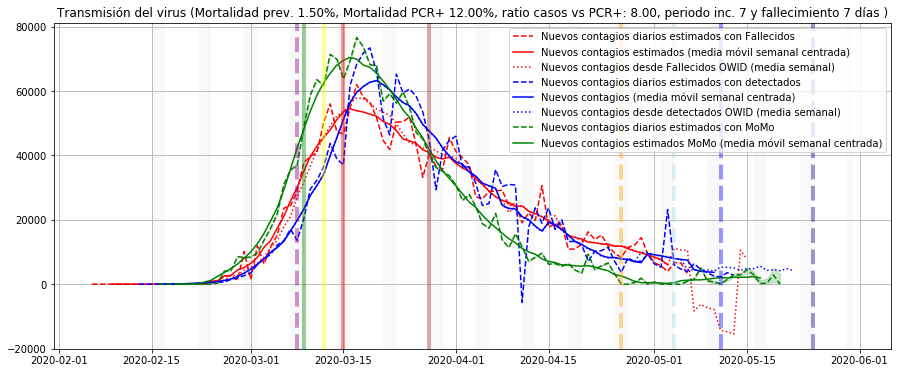

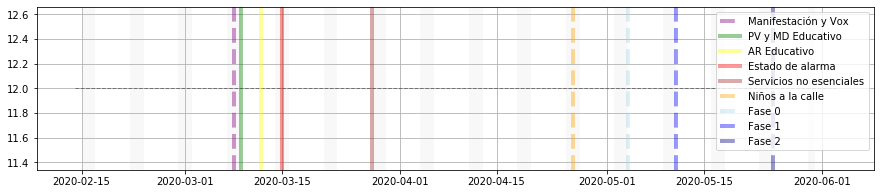

8.0


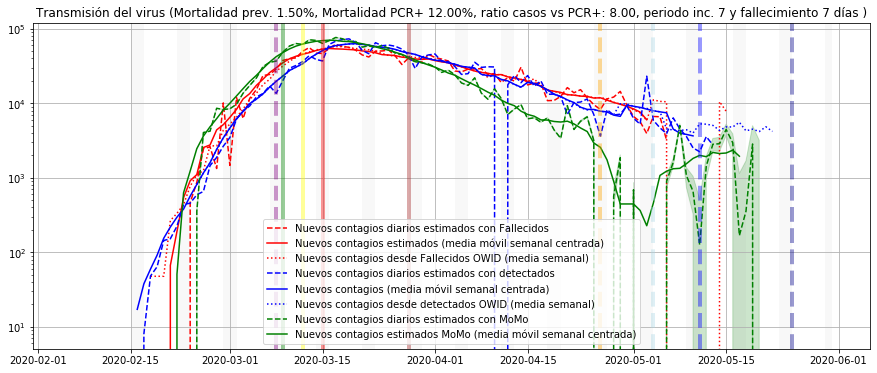

In [58]:
diasIncubacion = 7
diasRetraso = 7
mortalidadVsDetecciones = 12./100.
mortalidad = 1.5/100.
ratioCasosDetecciones = mortalidadVsDetecciones / mortalidad
print(ratioCasosDetecciones)
fig, ax = plt.subplots(figsize=(15,6))
plt.title('Transmisión del virus (Mortalidad prev. {:.2f}%, Mortalidad PCR+ {:.2f}%, ratio casos vs PCR+: {:.2f}, periodo inc. {} y fallecimiento {} días )'.format(
    100*mortalidad,100*mortalidadVsDetecciones,ratioCasosDetecciones,diasIncubacion,diasRetraso
))
ax.plot(kv.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),kv[['DFallecidos']]/mortalidad,'--',color='r',label='Nuevos contagios diarios estimados con Fallecidos')
ax.plot(kv.index-pd.DateOffset(days=diasRetraso+diasIncubacion),kv[['DFallecidos']].rolling(7,center=True).mean()/mortalidad,'-',color='r',
        label='Nuevos contagios estimados (media móvil semanal centrada)')
ax.plot(owid_spain.index-pd.DateOffset(days=(diasRetraso+diasIncubacion+1)),
        owid_spain.new_deaths.rolling(7,center=True).mean()/mortalidad,
                ls='dotted',
                color='r',
                label=u'Nuevos contagios desde Fallecidos OWID (media semanal)')
#ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean().shift(-1*diasRetraso)/.12,'-.',color='r',
#        label='Fallecidos (media móvil última semana)')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']]*ratioCasosDetecciones,'--',color='b',label='Nuevos contagios diarios estimados con detectados')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']].rolling(7,center=True).mean()*ratioCasosDetecciones,'-',color='b',
        label='Nuevos contagios (media móvil semanal centrada)')
ax.plot(owid_spain.index-pd.DateOffset(days=(diasIncubacion+1)),
        owid_spain.new_cases.rolling(7,center=True).mean()*ratioCasosDetecciones,
                ls='dotted',
                color='b',
                label=u'Nuevos contagios desde detectados OWID (media semanal)')



#ax.plot(owid_spain.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),
#        owid_spain.new_deaths.rolling(7,center=True).mean()/mortalidad,
#                ls='dotted',
#                color='r',
#                label=u'Nuevos contagios desde muertes OWID (media semanal)')
#ax.plot(owid_spain.index-pd.DateOffset(days=(diasIncubacion)),
#        owid_spain.new_cases.rolling(7,center=True).mean()*ratioCasosDetecciones,
#                ls='dotted',
#                color='b',
#                label=u'Nuevos contagios desde casos OWID (media semanal)')



#ax.plot(kv.index,kv[['DTotal']].rolling(7,center=False).mean(),'-.',color='b',
#        label='Nuevos casos  (media móvil última semana)')
ax.plot(momoNac.loc['2020-03-01':,'exceso_mortalidad'].index-pd.DateOffset(days=diasRetraso+diasIncubacion),
        momoNac.loc['2020-03-01':,'exceso_mortalidad']*27/43/mortalidad,'--',color='green',label='Nuevos contagios diarios estimados con MoMo')
ax.plot(momoNac.loc['2020-03-01':,'exceso_mortalidad'].index-pd.DateOffset(days=diasRetraso+diasIncubacion),
        momoNac.loc['2020-03-01':,'exceso_mortalidad'].rolling(7,center=True).mean()*27/43/mortalidad,'-',color='green',label='Nuevos contagios estimados MoMo (media móvil semanal centrada)')
#kvv.exceso_mortalidad.plot(ax=ax,c='r',lw=2,label='Exceso de mortalidad')
ax.fill_between( momoNac.loc['2020-03-01':,'exceso_mortalidad'].index-pd.DateOffset(days=diasRetraso+diasIncubacion), 
                (momoNac.loc['2020-03-01':,'defunciones_observadas_lim_inf']-
                 momoNac.loc['2020-03-01':,'defunciones_esperadas']).clip(lower=0)*27/43/mortalidad ,
                (momoNac.loc['2020-03-01':,'defunciones_observadas_lim_sup']-
                 momoNac.loc['2020-03-01':,'defunciones_esperadas']).clip(lower=0)*27/43/mortalidad, color='green', alpha=.2)





plt.legend(loc='upper right')
highlight_datetimes(momoNac.index, ax)


plt.grid()

#plt.yscale('log')
plt.show()


fig, ax = plt.subplots(figsize=(15,3))
plt.plot(momoNac.index,12*np.ones(len(momoNac.index)),axes=ax,ls='--',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')


highlight_datetimes(momoNac.index, ax)
 

plt.grid()
plt.legend(loc='upper right')

#plt.yscale('log')
plt.show()



diasIncubacion = 7
diasRetraso = 7
mortalidadVsDetecciones = 12./100.
mortalidad = 1.5/100.
ratioCasosDetecciones = mortalidadVsDetecciones / mortalidad
print(ratioCasosDetecciones)
fig, ax = plt.subplots(figsize=(15,6))
plt.title('Transmisión del virus (Mortalidad prev. {:.2f}%, Mortalidad PCR+ {:.2f}%, ratio casos vs PCR+: {:.2f}, periodo inc. {} y fallecimiento {} días )'.format(
    100*mortalidad,100*mortalidadVsDetecciones,ratioCasosDetecciones,diasIncubacion,diasRetraso
))
ax.plot(kv.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),kv[['DFallecidos']]/mortalidad,'--',color='r',label='Nuevos contagios diarios estimados con Fallecidos')
ax.plot(kv.index-pd.DateOffset(days=diasRetraso+diasIncubacion),kv[['DFallecidos']].rolling(7,center=True).mean()/mortalidad,'-',color='r',
        label='Nuevos contagios estimados (media móvil semanal centrada)')
ax.plot(owid_spain.index-pd.DateOffset(days=(diasRetraso+diasIncubacion+1)),
        owid_spain.new_deaths.rolling(7,center=True).mean()/mortalidad,
                ls='dotted',
                color='r',
                label=u'Nuevos contagios desde Fallecidos OWID (media semanal)')
#ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean().shift(-1*diasRetraso)/.12,'-.',color='r',
#        label='Fallecidos (media móvil última semana)')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']]*ratioCasosDetecciones,'--',color='b',label='Nuevos contagios diarios estimados con detectados')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']].rolling(7,center=True).mean()*ratioCasosDetecciones,'-',color='b',
        label='Nuevos contagios (media móvil semanal centrada)')
ax.plot(owid_spain.index-pd.DateOffset(days=(diasIncubacion+1)),
        owid_spain.new_cases.rolling(7,center=True).mean()*ratioCasosDetecciones,
                ls='dotted',
                color='b',
                label=u'Nuevos contagios desde detectados OWID (media semanal)')

#ax.plot(owid_spain.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),
#        owid_spain.new_deaths/mortalidad,
#                '--',
#                color='orange',
#                label=u'Nuevos contagios diarios estimados con OWID')





#ax.plot(kv.index,kv[['DTotal']].rolling(7,center=False).mean(),'-.',color='b',
#        label='Nuevos casos  (media móvil última semana)')
ax.plot(momoNac.loc['2020-03-01':,'exceso_mortalidad'].index-pd.DateOffset(days=diasRetraso+diasIncubacion),
        momoNac.loc['2020-03-01':,'exceso_mortalidad']*27/43/mortalidad,'--',color='green',label='Nuevos contagios diarios estimados con MoMo')
ax.plot(momoNac.loc['2020-03-01':,'exceso_mortalidad'].index-pd.DateOffset(days=diasRetraso+diasIncubacion),
        momoNac.loc['2020-03-01':,'exceso_mortalidad'].rolling(7,center=True).mean()*27/43/mortalidad,'-',color='green',label='Nuevos contagios estimados MoMo (media móvil semanal centrada)')
ax.fill_between( momoNac.loc['2020-03-01':,'exceso_mortalidad'].index-pd.DateOffset(days=diasRetraso+diasIncubacion), 
                (momoNac.loc['2020-03-01':,'defunciones_observadas_lim_inf']-
                 momoNac.loc['2020-03-01':,'defunciones_esperadas']).clip(lower=0)*27/43/mortalidad ,
                (momoNac.loc['2020-03-01':,'defunciones_observadas_lim_sup']-
                 momoNac.loc['2020-03-01':,'defunciones_esperadas']).clip(lower=0)*27/43/mortalidad, color='green', alpha=.2)


plt.legend(loc='lower center')



highlight_datetimes(momoNac.index, ax)


plt.grid()

plt.yscale('log')
plt.show()




In [59]:
owid_spain.tail().T

date,2020-05-29,2020-05-30,2020-05-31,2020-06-01,2020-06-02
iso_code,ESP,ESP,ESP,ESP,ESP
total_cases,238564,239228,239429,239638,239932
new_cases,658,664,201,209,294
total_deaths,27121,27125,27127,27940,27940
new_deaths,2,4,2,813,0
total_cases_per_million,5102.45,5116.65,5120.95,5125.42,5131.71
new_cases_per_million,14.073,14.202,4.299,4.47,6.288
total_deaths_per_million,580.069,580.155,580.197,597.586,597.586
new_deaths_per_million,0.043,0.086,0.043,17.389,0
total_tests,NaN,NaN,NaN,NaN,NaN


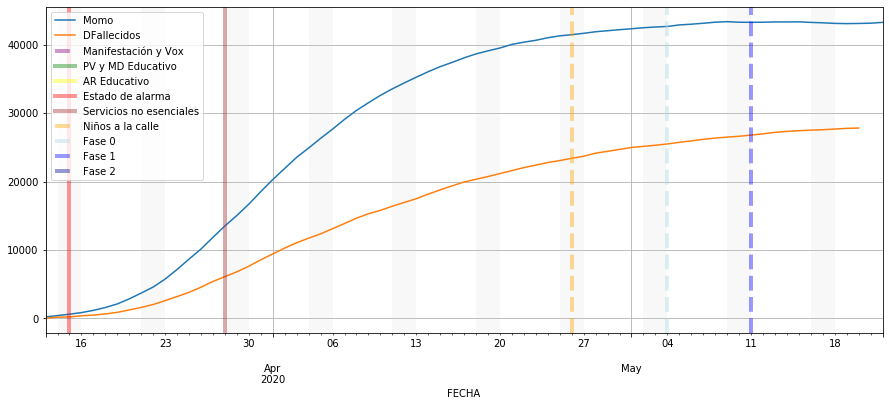

In [60]:
fig, ax = plt.subplots(figsize=(15,6))

((momoNac.loc['2020-03-13':'2020-05-22','defunciones_observadas'] -
    momoNac.loc['2020-03-13':'2020-05-22','defunciones_esperadas'])).cumsum().plot(ax=ax,label=r'Momo')
(datos.groupby('FECHA').sum().DFallecidos.loc['2020-03-13':'2020-05-22']).cumsum().plot(ax=ax)
highlight_datetimes(momoNac.index, ax,items=True)
plt.legend(loc='best')

#plt.yscale('log')
#plt.ylim(0,36)
plt.grid()
plt.show()

In [61]:
ktabla = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').copy()
ktabla.loc[:,u'España'] = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').sum(axis=1)
#ktabla.index.name = 'fecha_defuncion'
ktabla = ktabla.reindex(momoNac.index)
display(momoNac.tail())
display(ktabla.tail())
momoNac.index[-1]

,ambito,cod_ambito,cod_ine_ambito,nombre_ambito,cod_sexo,nombre_sexo,cod_gedad,nombre_gedad,defunciones_observadas,defunciones_observadas_lim_inf,defunciones_observadas_lim_sup,defunciones_esperadas,defunciones_esperadas_q01,defunciones_esperadas_q99,exceso_mortalidad
fecha_defuncion,,,,,,,,,,,,,,,
2020-05-30,nacional,NaN,NaN,NaN,all,todos,all,todos,1097,1075.730927,1119.867606,1026.5,946.38,1123.37,70.5
2020-05-31,nacional,NaN,NaN,NaN,all,todos,all,todos,1027,1003.232709,1050.400334,1023.0,934.15,1130.27,4.0
2020-06-01,nacional,NaN,NaN,NaN,all,todos,all,todos,1038,1006.850745,1069.848614,1029.5,919.66,1130.27,8.5
2020-06-02,nacional,NaN,NaN,NaN,all,todos,all,todos,1095,1043.951297,1146.830873,1027.0,909.07,1130.27,68.0
2020-06-03,nacional,NaN,NaN,NaN,all,todos,all,todos,1000,894.728656,1105.810195,1029.5,909.07,1130.27,0.0


CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC,España
fecha_defuncion,,,,,,,,,,,,,,,,,,,,
2020-05-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-06-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Timestamp('2020-06-03 00:00:00')

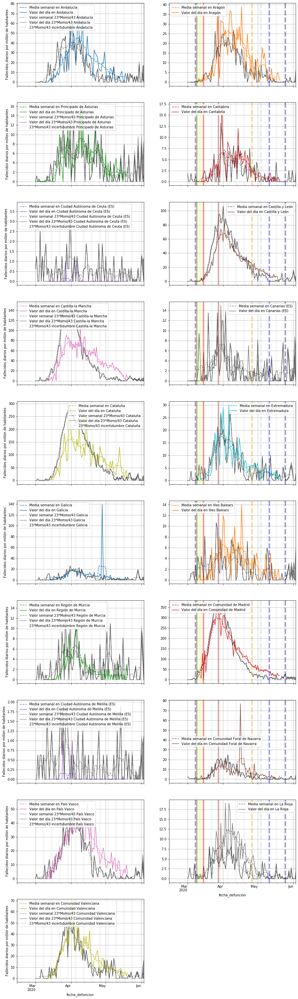

In [62]:
axes = (datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').rolling(7,center=True).mean()).plot(subplots=True, 
           grid=True,ls='--',
           figsize=(15, 60),
           layout=(10, 2))
indices = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).index
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        kmomo = (momo[(momo.cod_ambito == kaxi[0].legendlabels[0])&((momo.cod_sexo=='all')&(momo.cod_gedad=='all'))]).loc['2020-03-01':]


        highlight_datetimes(kmomo.index, kaxi[0],items=False)
        #kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos diarios por millón de habitantes')
        kaxi[0].set_xlim([momoNac.index[0],momoNac.index[-1]])
        ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='-',c=kaxi[0].get_lines()[-1].get_color())
        #ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)
        
        
        #kaxi[0].axhline(y=5,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        

        (kmomo.loc['2020-03-01':,'exceso_mortalidad'].rolling(7,center=True).mean()*27/43).plot(ls='--',ax=kaxi[0],color='k',alpha=.4)#,label='Nuevos contagios diarios estimados con MoMo')
        (kmomo.loc['2020-03-01':,'exceso_mortalidad']*27/43).plot(ls='-',ax=kaxi[0],color='k',alpha=.4)#,label='Nuevos contagios diarios estimados con MoMo')
        #kaxi[0].plot(kmomo.loc['2020-03-01':,'exceso_mortalidad'].index,
        #             kmomo.loc['2020-03-01':,'exceso_mortalidad'].clip(lower=0)*27/43,'--',color='green')
    
        #kaxi[0].plot(kmomo.loc['2020-03-01':,'exceso_mortalidad'].index,
        #        kmomo.loc['2020-03-01':,'exceso_mortalidad'].rolling(7,center=True).mean()*27/43,'-',color='k',label='Nuevos contagios estimados MoMo (media móvil semanal centrada)')
        kaxi[0].fill_between(kmomo.loc['2020-03-01':,'exceso_mortalidad'].index, 
                        (kmomo.loc['2020-03-01':,'defunciones_observadas_lim_inf']-
                         kmomo.loc['2020-03-01':,'defunciones_esperadas']).clip(lower=0)*27/43 ,
                        (kmomo.loc['2020-03-01':,'defunciones_observadas_lim_sup']-
                         kmomo.loc['2020-03-01':,'defunciones_esperadas']).clip(lower=0)*27/43, color='k', alpha=.4)
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor semanal 23*Momo/43 ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor del día 23*Momo/43 ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         '23*Momo/43 incertidumbre ' + poblacion.at[kaxi[0].legendlabels[0],'GEO']
                        ])


        kaxi[0].grid()


        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='-',c=kaxi[1].get_lines()[-1].get_color())
        #ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[1],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         #'23*Momo/43 en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO']
                        ])
        
        #kaxi[1].axhline(y=5,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        kmomo = (momo[(momo.cod_ambito == kaxi[1].legendlabels[0])&((momo.cod_sexo=='all')&(momo.cod_gedad=='all'))]).loc['2020-03-01':]

        (kmomo.loc['2020-03-01':,'exceso_mortalidad'].rolling(7,center=True).mean()*27/43).plot(ls='--',ax=kaxi[1],color='k',alpha=.4)#,label='Nuevos contagios diarios estimados con MoMo')
        (kmomo.loc['2020-03-01':,'exceso_mortalidad']*27/43).plot(ls='-',ax=kaxi[1],color='k',alpha=.4)#,label='Nuevos contagios diarios estimados con MoMo')


        kaxi[1].fill_between(kmomo.loc[:,'exceso_mortalidad'].index, 
                        (kmomo.loc[:,'defunciones_observadas_lim_inf']-
                         kmomo.loc[:,'defunciones_esperadas']).clip(lower=0)*27/43 ,
                        (kmomo.loc[:,'defunciones_observadas_lim_sup']-
                         kmomo.loc[:,'defunciones_esperadas']).clip(lower=0)*27/43, color='k', alpha=.4)


        kaxi[1].grid()
        highlight_datetimes(kmomo.index, kaxi[1],items=True)


    except:
        continue
#kcolor = kaxi[0].get_lines()[-1].get_color()
#ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kcolor)

plt.show()

In [63]:
menos74 = momo[(momo.ambito == 'nacional')&((momo.cod_sexo=='all')&(momo.nombre_gedad.isin(['edad < 65', 'edad 65-74'])))].groupby(level='fecha_defuncion',axis=0).sum()
mas74 = momo[(momo.ambito == 'nacional')&((momo.cod_sexo=='all')&(momo.nombre_gedad.isin([ 'edad > 75'])))].groupby(level='fecha_defuncion',axis=0).sum()

     

In [64]:
menos74.head()

,cod_ine_ambito,defunciones_observadas,defunciones_observadas_lim_inf,defunciones_observadas_lim_sup,defunciones_esperadas,defunciones_esperadas_q01,defunciones_esperadas_q99,exceso_mortalidad
fecha_defuncion,,,,,,,,
2018-05-17,0.0,294,294.0,294.0,300.0,246.59,339.86,2.0
2018-05-18,0.0,319,319.0,319.0,300.0,244.28,343.86,20.0
2018-05-19,0.0,307,307.0,307.0,301.5,242.90,343.86,10.5
2018-05-20,0.0,288,288.0,288.0,300.5,246.45,342.55,0.5
2018-05-21,0.0,269,269.0,269.0,299.0,244.76,347.86,0.0


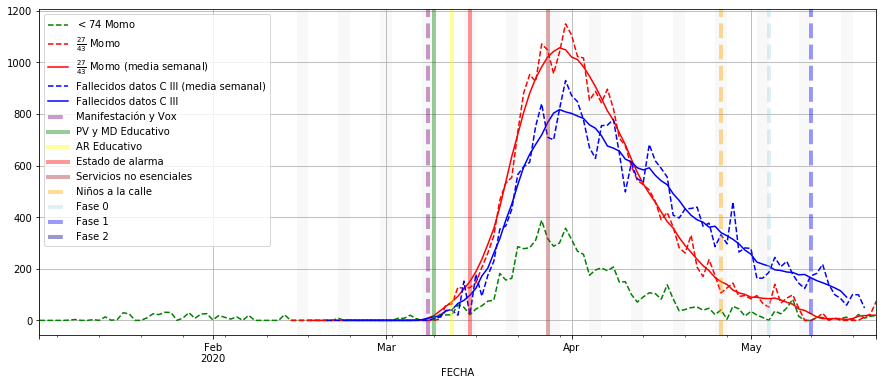

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
menos74.loc['01/03/2020':'22/05/2020','exceso_mortalidad'].plot(ax=ax,c='green',ls='--',label=r'$<74$ Momo')
(27/43*(momoNac.loc['01/03/2020':'22/05/2020','exceso_mortalidad'])).plot(ax=ax,c='r',ls='--',label=r'$\frac{27}{43}$ Momo')
(27/43*(momoNac.rolling(7,center=True).mean().loc['01/03/2020':'22/05/2020','exceso_mortalidad'])).plot(ax=ax,c='r',ls='-',label=r'$\frac{27}{43}$ Momo (media semanal)')
(datos.groupby('FECHA').sum().DFallecidos.loc['01/03/2020':'22/05/2020']).plot(ax=ax,c='b',ls='--',label='Fallecidos datos C III (media semanal)')
(datos.groupby('FECHA').sum().DFallecidos.rolling(7,center=True).mean().loc['01/03/2020':'22/05/2020']).plot(ax=ax,c='b',ls='-',label='Fallecidos datos C III')
highlight_datetimes(momoNac.index, ax,items=True)
plt.legend(loc='best')

#plt.yscale('log')
#plt.ylim(0,36)
plt.grid()
plt.show()

In [66]:
menos74.loc['13/03/2020':'22/05/2020'].cumsum().tail().T

fecha_defuncion,2020-05-18,2020-05-19,2020-05-20,2020-05-21,2020-05-22
cod_ine_ambito,0.000000,0.000000,0.000000,0.000000,0.000000
defunciones_observadas,27766.000000,28088.000000,28397.000000,28706.000000,29027.000000
defunciones_observadas_lim_inf,27740.234234,28059.697989,28366.219269,28672.446495,28990.040410
defunciones_observadas_lim_sup,27796.748297,28120.636613,28432.458100,28744.607585,29069.444276
defunciones_esperadas,20590.500000,20889.500000,21191.000000,21489.000000,21791.000000
defunciones_esperadas_q01,16682.070000,16927.830000,17173.590000,17419.350000,17661.630000
defunciones_esperadas_q99,24535.170000,24882.410000,25233.030000,25585.890000,25942.200000
exceso_mortalidad,7355.500000,7378.500000,7387.000000,7403.000000,7422.000000


In [67]:
mas74.loc['13/03/2020':'22/05/2020'].cumsum().tail().T

fecha_defuncion,2020-05-18,2020-05-19,2020-05-20,2020-05-21,2020-05-22
cod_ine_ambito,0.000000,0.000000,0.000000,0.000000,0.000000
defunciones_observadas,88772.000000,89455.000000,90208.000000,90973.000000,91811.000000
defunciones_observadas_lim_inf,88732.921013,89411.978971,90161.228301,90922.057297,91754.810375
defunciones_observadas_lim_sup,88817.295283,89503.517657,90260.540486,91030.004801,91873.586083
defunciones_esperadas,53356.750000,54103.250000,54850.750000,55599.250000,56349.750000
defunciones_esperadas_q01,48100.100000,48785.170000,49461.970000,50138.770000,50815.570000
defunciones_esperadas_q99,59458.305000,60277.770000,61097.235000,61928.955000,62768.955000
exceso_mortalidad,35707.000000,35707.000000,35712.500000,35729.000000,35816.500000


In [68]:
momo.nombre_gedad.unique()

array(['todos', 'edad < 65', 'edad 65-74', 'edad > 75'], dtype=object)

In [69]:
35883.500000+7328.000000

43211.5